<a href="https://colab.research.google.com/github/rlskoeser/shxco-missingdata-specreading/blob/main/missing-data/Sco_prophet_missingdata_weekly.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Predict Weekly Missing Data from Shakespeare and Company Project 

## Setup Libraries and Load S&Co Data



In [ ]:
%%capture
try:
    import prophet
except ImportError:
    # If prophet is not installed, install it. We usually used Prophet in Google Colab.
    !pip install prophet

In [114]:
import pandas as pd
import requests
from datetime import timedelta, datetime, date
from datetimerange import DateTimeRange
import math
import warnings
warnings.filterwarnings('ignore')
import altair as alt
alt.data_transformers.disable_max_rows()

from prophet import Prophet

In [2]:
# use v1.2 datasets; load from our repo for convenience
csv_urls = {
    # official published versions 
    'members': 'https://raw.githubusercontent.com/rlskoeser/shxco-missingdata-specreading/main/data/source-data/SCoData_members_v1.2_2022-01.csv',
    'books': 'https://raw.githubusercontent.com/rlskoeser/shxco-missingdata-specreading/main/data/source-data/SCoData_books_v1.2_2022-01.csv',
    'events': 'https://raw.githubusercontent.com/rlskoeser/shxco-missingdata-specreading/main/data/source-data/SCoData_events_v1.2_2022-01.csv',

    # project-specific data
    'partial_borrowers': 'https://raw.githubusercontent.com/rlskoeser/shxco-missingdata-specreading/main/data/partial_borrowers_collapsed.csv',
    'borrow_overrides': 'https://raw.githubusercontent.com/rlskoeser/shxco-missingdata-specreading/main/data/long_borrow_overrides.csv'
}

In [3]:
# load events
events_df = pd.read_csv(csv_urls['events'], low_memory=False)

## Prepare logbook event data

Logbooks are one of the primary sources of data for the S&Co Project, and detail the membership, renewal, and reimbursement activities. You can read more about them on the Project website [https://shakespeareandco.princeton.edu/sources/logbooks/](https://shakespeareandco.princeton.edu/sources/logbooks/).

In [4]:
# identify to logbook events

logbook_events_df = events_df[events_df.source_type.str.contains('Logbook')][[
   'event_type', 'start_date', 'end_date', 'subscription_purchase_date',
   'member_uris', 'member_names',
   'subscription_duration', 'subscription_duration_days',
   'subscription_volumes', 'subscription_category',
   'source_type'
]]

# May need to add format="mixed" depending on platform
logbook_events_df['start_date'] = pd.to_datetime(logbook_events_df['start_date'])
logbook_events_df['subscription_purchase_date'] = pd.to_datetime(logbook_events_df['subscription_purchase_date'])
logbook_events_df['logbook_date'] = logbook_events_df.apply(lambda row: row.subscription_purchase_date if pd.notna(row.subscription_purchase_date) else row.start_date, axis=1)


In [5]:
def earliest_date(row):
  # earliest date is the start date, subscription purchase date, or end date
  dates = [val for val in [row.start_date, row.subscription_purchase_date, row.end_date] if not pd.isna(val)]
  if dates:
    return min(dates)

membership_events = events_df[events_df.event_type.isin(['Renewal', 'Subscription', 'Reimbursement' ,'Supplement', 'Separate Payment'])]
nonlogbook_membership_events = membership_events[~membership_events.source_type.str.contains('Logbook')]
membership_events['earliest_date'] = membership_events.apply(earliest_date, axis=1)
membership_events['date'] = pd.to_datetime(membership_events['earliest_date'], errors='coerce')

## Calculate logbook gaps

While much of the membership data is consistent, there are periods where there are gaps in the data, largely for archival reasons. We have calculated these gaps and now can explore their distribution.

In [6]:
response = requests.get('https://raw.githubusercontent.com/rlskoeser/shxco-missingdata-specreading/main/data/logbook-dates.json')
logbook_dates = response.json()


In [7]:
# don't consider gaps shorter than 15 days
MIN_GAP_DAYS = 15

logbook_gaps = []
skipped_gaps = []

oneday = timedelta(days=1)


for i in range(len(logbook_dates) - 1):
  # gaps are between the logbook dates, so gap start is end of the first
  # and gap end is the start of the next

  # gap start and end dates are now included in the range instead of bounds outside the range
  gap_start = pd.to_datetime(logbook_dates[i]['endDate']) + oneday
  gap_end = pd.to_datetime(logbook_dates[i+1]['startDate']) - oneday
  interval = { 'start': gap_start, 'end': gap_end, 'days': (gap_end - gap_start).days }

  if interval['days'] > MIN_GAP_DAYS:
      logbook_gaps.append(interval) 
  elif interval['days'] > 0:  # ignore 0 and -1 duration "gaps"!
     skipped_gaps.append(interval)


print(f"The {len(logbook_gaps)} large gaps in the logbooks")
for interval in logbook_gaps:
    print(f"\t{interval['start'].strftime('%B %d %Y')} to {interval['end'].strftime('%B %d %Y')} ({interval['days']} days)")

print(f"\nThe {len(skipped_gaps)} small gaps in the logbooks that will be skipped")
for interval in skipped_gaps:
    print(f"\t{interval['start'].strftime('%B %d %Y')} to {interval['end'].strftime('%B %d %Y')} ({interval['days']} day{'s' if interval['days'] != 1 else ''})")

The 6 large gaps in the logbooks
	January 01 1928 to February 29 1928 (59 days)
	January 03 1930 to June 01 1930 (149 days)
	August 01 1930 to December 31 1930 (152 days)
	February 17 1931 to September 25 1932 (586 days)
	January 01 1937 to February 16 1938 (411 days)
	May 06 1938 to October 20 1938 (167 days)

The 5 small gaps in the logbooks that will be skipped
	October 30 1927 to November 01 1927 (2 days)
	February 07 1934 to February 08 1934 (1 day)
	January 01 1935 to January 11 1935 (10 days)
	December 29 1935 to January 01 1936 (3 days)
	August 29 1939 to September 12 1939 (14 days)


In [8]:
# get logbook event data *except* for during gaps
# — v1.2 dataset has 9 stray events in these gaps; 8 misattributed to logbook source, one documented in a later logbook

logbook_events_nogaps = logbook_events_df.copy()

for i, gap in enumerate(logbook_gaps):
  gap_start = gap['start']
  gap_end = gap['end']
  logbook_events_nogaps = logbook_events_nogaps[~((logbook_events_nogaps.logbook_date >= gap_start) & (logbook_events_nogaps.logbook_date <= gap_end))]



# Missing membership events

## Logbook / membership events by week

In [16]:
logbooks_weekly_count = logbook_events_nogaps.groupby([pd.Grouper(key='logbook_date', freq='W')])['event_type'].count().reset_index()
logbooks_weekly_count.rename(columns={'event_type': 'total'}, inplace=True)

logbook_gaps_df = pd.DataFrame(logbook_gaps)
logbook_gaps_df['gap_label'] = logbook_gaps_df.apply(lambda row: '%s to %s (%d days)' % (row.start.date().isoformat(), row.end.date().isoformat(), row.days), axis=1)

# missing members

## member data setup

In [17]:
# split multiple members for shared accounts in events
events_df[
    ["first_member_uri", "second_member_uri"]
] = events_df.member_uris.str.split(";", expand=True)

# working with the first member for now...
# generate short ids equivalent to those in member and book dataframes
events_df["member_id"] = events_df.first_member_uri.apply(
    lambda x: x.split("/")[-2]
)
events_df["item_id"] = events_df.item_uri.apply(
    lambda x: x.split("/")[-2] if pd.notna(x) else None
)

In [18]:
# looking at all the data, what is the first event for each member?
member_dates = events_df.copy()

# make sure each event has an earliest known date
def earliest_date(row):
  dates = [val for val in [row.start_date, row.subscription_purchase_date, row.end_date] if not pd.isna(val)]
  if dates:
    return min(dates)     

member_dates['earliest_date'] = member_dates.apply(earliest_date, axis=1)

In [19]:
# convert earliest date to datetime; convert partially known dates to -01-01  for now
member_dates['date'] = pd.to_datetime(member_dates['earliest_date'], errors='coerce')

In [20]:
# limit to the fields we want, drop unknown dates
members_added = member_dates[['event_type', 'member_id', 'date', 'source_type']].dropna(subset=['date'])

In [21]:
members_added = members_added[members_added['date'] < datetime(1942, 1, 1)]

In [22]:
# limit to member uri and date; then group by member and get the first date
members_grouped = members_added[["member_id", "date"]].groupby("member_id")
members_first_dates = members_grouped.first().reset_index()


In [23]:
newmember_yearly_count = members_first_dates.groupby([pd.Grouper(key='date', freq='Y')])['member_id'].count().reset_index()
newmember_yearly_count.rename(columns={'member_id': 'total'}, inplace=True)

In [24]:
# group again but report on source and event type;
# customize sorting to order so subscriptions will show up first
from pandas.api.types import CategoricalDtype

# main order we care about is subscription first; other order matters less; reimbursement would be expected last
event_type = CategoricalDtype(categories=["Subscription", "Renewal", "Separate Payment", "Borrow", "Purchase", "Supplement", "Request", "Gift", "Crossed out", "Reimbursement"], ordered=True)
# copy member data frame, and convert event type to our new categorical type
member_events = members_added.copy()

member_events['event_type'] = member_events.event_type.astype(event_type)

# sort by date, then sort by event type so if there are any same-day events,
# subscription should always be first
member_events = member_events.sort_values(by=['date', 'event_type'])

members_first_events = member_events.groupby("member_id").first().reset_index()


### new members added, logbooks only

In [25]:
# get first events for each member from logbooks only

# go back to member events, limit to logbook events, then group and get first event
logbook_first_events = member_events[member_events.source_type.str.contains('Logbook')].groupby("member_id").first().reset_index()


In [26]:
# get new member yearly count for logbook-sourced events only 
logbook_newmembers_by_year = logbook_first_events.groupby([pd.Grouper(key='date', freq='Y')])['member_id'].count().reset_index()
logbook_newmembers_by_year.rename(columns={'member_id': 'total'}, inplace=True)


### aggregate by month instead of year

confusing because totals and graphs in the dataset essay are monthly, it looks wrong

In [27]:
# get new member monthly count for logbook-sourced events only 
logbook_newmembers_by_month = logbook_first_events.groupby([pd.Grouper(key='date', freq='M')])['member_id'].count().reset_index()
logbook_newmembers_by_month.rename(columns={'member_id': 'total'}, inplace=True)

In [28]:
newmember_monthly_count = members_first_dates.groupby([pd.Grouper(key='date', freq='M')])['member_id'].count().reset_index()
newmember_monthly_count.rename(columns={'member_id': 'total'}, inplace=True)

### members only documented in address books

In [29]:
# what about members we _only_ know about from the address books?

# any member with at least one event in the logbooks
logbook_members = member_events[member_events.source_type.str.contains('Logbook')].member_id.unique()
# any member with at least one event on a card
lending_card_members = member_events[member_events.source_type.str.contains('Lending Library Card')].member_id.unique()
# any member with at least one event from an address book
addressbook_members = member_events[member_events.source_type.str.contains('Address Book')].member_id.unique()

# get a list of address-book-only members 
address_book_only_members = set(member_events.member_id.unique()) - set(logbook_members) - set(lending_card_members)



In [30]:
# get date added for address-only members

addressbook_first_events = member_events[member_events.member_id.isin(address_book_only_members)].groupby("member_id").first().reset_index()


In [31]:
# get new member yearly count for addressbook-only members events only 
addressbook_newmembers_by_year = addressbook_first_events.groupby([pd.Grouper(key='date', freq='Y')])['member_id'].count().reset_index()
addressbook_newmembers_by_year.rename(columns={'member_id': 'total'}, inplace=True)

### members only documented on lending cards

In [32]:
# do we have any lending-card only members?

# get a list of address-book-only members 
lending_card_only_members = set(member_events.member_id.unique()) - set(logbook_members) - set(addressbook_members)


In [33]:
# card-only member first events
cardonly_first_events = member_events[member_events.member_id.isin(lending_card_only_members)].groupby("member_id").first().reset_index()


In [34]:
# get new member yearly count for lending card-only members
cardonly_newmembers_by_year = cardonly_first_events.groupby([pd.Grouper(key='date', freq='Y')])['member_id'].count().reset_index()
cardonly_newmembers_by_year.rename(columns={'member_id': 'total'}, inplace=True)


### other members

In [35]:
# get all other members so we can generate stacked area chart properly

other_members = set(member_events.member_id.unique()) - set(lending_card_only_members) - set(address_book_only_members)
 

In [36]:
# other member first events
other_member_first_events = member_events[member_events.member_id.isin(other_members)].groupby("member_id").first().reset_index()


In [37]:
# new member yearly count 
other_newmembers_by_year = other_member_first_events.groupby([pd.Grouper(key='date', freq='Y')])['member_id'].count().reset_index()
other_newmembers_by_year.rename(columns={'member_id': 'total'}, inplace=True)


In [38]:
# plot all three sets of new members together

# combine into a single df for plotting with altair

def combine_newmember_counts():
  # new_member_counts = newmember_yearly_count.copy()
  # new_member_counts['series'] = 'all events'

  # FIXME: this is not plotting the same thing as the others!
  # logbook_newmembers = logbook_newmembers_by_year.copy()
  # logbook_newmembers['series'] = 'logbook events only'

  other_newmembers = other_newmembers_by_year.copy()
  other_newmembers['series'] = 'all other members'

  addressbook_newmembers = addressbook_newmembers_by_year.copy()
  addressbook_newmembers['series'] = 'addressbook-only members'
  
  card_newmembers = cardonly_newmembers_by_year.copy()
  card_newmembers['series'] = 'card-only members'
  
  # combined_new_member_counts_df = pd.concat([new_member_counts, logbook_newmembers, addressbook_newmembers])
  combined_new_member_counts_df = pd.concat([other_newmembers, addressbook_newmembers, card_newmembers])

  return combined_new_member_counts_df

combine_newmember_counts_df = combine_newmember_counts()



# # clear from any previous run
# plt.clf()
# # setup shared axis
# fig, ax = plt.subplots(figsize=(20, 5))

# sns.lineplot(data=newmember_yearly_count, x='date', y='total', label='new members (all events)')
# sns.lineplot(data=logbook_newmembers_by_year, x='date', y='total', label='new members (logbook events only)')
# sns.lineplot(data=addressbook_newmembers_by_year, x='date', y='total', label='new members (addressbook-only members)')

# for i, gap in enumerate(logbook_gaps): 
#   gap_start = pd.to_datetime(gap['start'])
#   gap_end = pd.to_datetime(gap['end'])
#   ax.axvspan(gap_start, gap_end, color="gray", alpha=0.2)

### aggregate new members from source by month

In [39]:
# get new member monthly count for addressbook-only members events only 
addressbook_newmembers_by_month = addressbook_first_events.groupby([pd.Grouper(key='date', freq='M')])['member_id'].count().reset_index()
addressbook_newmembers_by_month.rename(columns={'member_id': 'total'}, inplace=True)


In [41]:
# get new member monthly count for lending card-only members
cardonly_newmembers_by_month = cardonly_first_events.groupby([pd.Grouper(key='date', freq='M')])['member_id'].count().reset_index()
cardonly_newmembers_by_month.rename(columns={'member_id': 'total'}, inplace=True)


In [42]:
# new member monthly count 
other_newmembers_by_month = other_member_first_events.groupby([pd.Grouper(key='date', freq='M')])['member_id'].count().reset_index()
other_newmembers_by_month.rename(columns={'member_id': 'total'}, inplace=True)


In [43]:
# combine into a single df for plotting with altair

def combine_newmember_monthly_counts():
  # new_member_counts = newmember_yearly_count.copy()
  # new_member_counts['series'] = 'all events'

  # FIXME: this is not plotting the same thing as the others!
  # logbook_newmembers = logbook_newmembers_by_year.copy()
  # logbook_newmembers['series'] = 'logbook events only'

  other_newmembers = other_newmembers_by_month.copy()
  other_newmembers['series'] = 'all other members'

  addressbook_newmembers = addressbook_newmembers_by_month.copy()
  addressbook_newmembers['series'] = 'addressbook-only members'
  
  card_newmembers = cardonly_newmembers_by_month.copy()
  card_newmembers['series'] = 'card-only members'
  
  # combined_new_member_counts_df = pd.concat([new_member_counts, logbook_newmembers, addressbook_newmembers])
  combined_new_member_counts_df = pd.concat([other_newmembers, addressbook_newmembers, card_newmembers])

  return combined_new_member_counts_df

combine_newmember_monthly_counts_df = combine_newmember_monthly_counts()



## new members by first subscription

In [44]:
# to model properly, we only expect membership to start with a subscription
# include renewals, since sometimes they were written down for each other

# go back to member events, limit to logbooks AND by event type, then group and get first event for each member
subscription_first_events = member_events[member_events.source_type.str.contains('Logbook') & member_events.event_type.isin(['Subscription', 'Renewal'])].groupby("member_id").first().reset_index()

In [45]:
# exclude from gaps, just in case

subscription_first_events_nogaps = subscription_first_events.copy()

for i, gap in enumerate(logbook_gaps):
  gap_start = gap['start']
  gap_end = gap['end']
  subscription_first_events_nogaps = subscription_first_events_nogaps[~((subscription_first_events_nogaps.date >= gap_start) & (subscription_first_events_nogaps.date <= gap_end))]



In [173]:
# get new member yearly count based only on subscriptions
# newmember_subscriptions_by_year = subscription_first_events.groupby([pd.Grouper(key='date', freq='Y')])['member_id'].count().reset_index()

newmember_subscriptions_by_year = subscription_first_events_nogaps.groupby([pd.Grouper(key='date', freq='Y')])['member_id'].count().reset_index()
newmember_subscriptions_by_year.rename(columns={'member_id': 'total'}, inplace=True)


In [174]:
# get new member monthly count based only on subscriptions, so we can forecast with prophet
newmember_subscriptions_by_week = subscription_first_events_nogaps.groupby([pd.Grouper(key='date', freq='W')])['member_id'].count().reset_index()
newmember_subscriptions_by_week.rename(columns={'member_id': 'total'}, inplace=True)

### use prophet to forecast missing subscriptions

In [194]:
def prepare_data_for_prophet(weekly_subscriptions, gap_start_date, post1932_date):
    # Filter data based on gap start date and post1932 condition
    data_before_gap = weekly_subscriptions[weekly_subscriptions.date < gap_start_date]
    if gap_start_date.year >= 1936:
        data_before_gap = data_before_gap[data_before_gap.date >= post1932_date]
    # Rename columns for Prophet
    return data_before_gap.rename(columns={'date': 'ds', 'total': 'y'})

def forecast_gap_with_prophet(data_before_gap, gap_duration, one_week_duration, use_weekly_growth_cap=False, growth_cap=None):
    # Initialize Prophet and fit data
    if use_weekly_growth_cap:
        prophet_model = Prophet(growth='logistic', weekly_seasonality=True)
        data_before_gap['floor'] = 0
        data_before_gap['cap'] = growth_cap
    else:
        prophet_model = Prophet()
    prophet_model.fit(data_before_gap)
    
    # Calculate forecast period in weeks and add extra buffer
    forecast_duration = math.ceil(gap_duration['days'] / 7) + 7
    future_subscriptions = prophet_model.make_future_dataframe(periods=forecast_duration, freq='W')
    
    # Perform forecasting
    if use_weekly_growth_cap:
        future_subscriptions['floor'] = 0
        future_subscriptions['cap'] = growth_cap
    forecasted_subscriptions = prophet_model.predict(future_subscriptions)
    
    # Filter forecast for the gap duration with an additional one-week buffer
    forecast_near_gap = forecasted_subscriptions[(forecasted_subscriptions.ds > (gap_duration['start'] - one_week_duration)) & (forecasted_subscriptions.ds < (gap_duration['end'] + one_week_duration))]
    return forecasted_subscriptions

def forecast_missing_subscriptions(weekly_subscriptions, logbook_gaps, post1932_date, train_all_data=False, return_prophet_model=False, use_weekly_growth_cap=False, use_total_growth_cap=False):
    one_week_duration = timedelta(days=7)
    
    growth_cap = weekly_subscriptions.total.max() if use_weekly_growth_cap else None
    if train_all_data:
        prophet_model = Prophet(weekly_seasonality=True, growth='logistic') if use_total_growth_cap else Prophet(weekly_seasonality=True)
        if use_total_growth_cap:
            weekly_subscriptions['floor'] = 0
            weekly_subscriptions['cap'] = growth_cap
        prophet_model.fit(weekly_subscriptions.rename(columns={'date': 'ds', 'total': 'y'}))
    
    all_forecasts = []

    for gap in logbook_gaps:
        gap_start_date = gap['start']

        data_before_gap = prepare_data_for_prophet(weekly_subscriptions, gap_start_date, post1932_date)
        forecasted_subscriptions = forecast_gap_with_prophet(data_before_gap, gap, one_week_duration, use_weekly_growth_cap, growth_cap)
        
        # Optional: Display or process forecast_near_gap as needed
        # display(forecast_near_gap.head())

        if train_all_data:
            if use_total_growth_cap:
                forecasted_subscriptions['floor'] = 0
                forecasted_subscriptions['cap'] = growth_cap

            reforecasted_subscriptions = prophet_model.predict(forecasted_subscriptions)
            all_forecasts.append(reforecasted_subscriptions)
        else:
            all_forecasts.append(forecasted_subscriptions)

    # Combine all forecasts into a single DataFrame
    if return_prophet_model:
        return prophet_model, pd.concat(all_forecasts)
    else:
        return pd.concat(all_forecasts)

post1932_date = pd.to_datetime(date(1932, 9, 27))
# Assuming `weekly_subscriptions` and `logbook_gaps` are defined elsewhere
forecasted_subscriptions = forecast_missing_subscriptions(newmember_subscriptions_by_week, logbook_gaps, post1932_date)

15:51:34 - cmdstanpy - INFO - Chain [1] start processing


15:51:34 - cmdstanpy - INFO - Chain [1] done processing
15:51:34 - cmdstanpy - INFO - Chain [1] start processing
15:51:34 - cmdstanpy - INFO - Chain [1] done processing
15:51:34 - cmdstanpy - INFO - Chain [1] start processing
15:51:35 - cmdstanpy - INFO - Chain [1] done processing
15:51:35 - cmdstanpy - INFO - Chain [1] start processing
15:51:35 - cmdstanpy - INFO - Chain [1] done processing
15:51:35 - cmdstanpy - INFO - Chain [1] start processing
15:51:35 - cmdstanpy - INFO - Chain [1] done processing
15:51:35 - cmdstanpy - INFO - Chain [1] start processing
15:51:35 - cmdstanpy - INFO - Chain [1] done processing


In [195]:
def plot_gap_areas(logbook_gaps, chart_height, include_line=False):
    if include_line:
        base = alt.Chart(newmember_subscriptions_by_week).encode(
            alt.X('date:T', axis=alt.Axis(title='Duration of the Lending Library'))
        ).properties(
            width=1200,
            height=chart_height
        )


        line = base.mark_line(stroke='#5276A7').encode(
            alt.Y('total',
                axis=alt.Axis(title='Total', titleColor='#5276A7'))
        )

    gap_areas = None
    for gap in logbook_gaps:

        rect_df = pd.DataFrame({
            'x1': [pd.to_datetime(gap['start'])],
            'x2': [pd.to_datetime(gap['end'])],
        })
        area = alt.Chart(rect_df).mark_rect(opacity=0.3, color='gray').encode(
            x='x1', x2='x2',
            y=alt.value(0), y2=alt.value(chart_height)
        )

        if gap_areas is None:
            gap_areas = area 
        else:
            gap_areas += area
    return line + gap_areas if include_line else gap_areas

def plot_newsubs_weekly_forecast(forecast_df, gap_areas, logbook_gaps, chart_height, post1932, show_model=False, separate_model_decades=False, newmember_subscriptions_by_week=newmember_subscriptions_by_week ):
    forecast_uniq = forecast_df.drop_duplicates(keep='first').reset_index(drop=True)
    known_df = newmember_subscriptions_by_week.copy()

    # Set base chart properties
    base = alt.Chart().encode(
        alt.X('date:T', axis=alt.Axis(title='Date'))
    ).properties(
        width=1200,
        height=chart_height  # Assuming `chart_height` is intended to be 600, adjust as needed
    )
    
    line_width = 1

    # label as documented information
    known_df['label'] = "Documented"
    label_colors = {"Documented": "#5276A7", "Forecast model - 1920s": "red", "Forecast model - 1930s": "purple", "Forecast": "orange", "Forecast model": "red"}

    if not show_model:
        keys_to_remove = ["Forecast model", "Forecast model - 1920s", "Forecast model - 1930s"]
    elif separate_model_decades:
        keys_to_remove = ["Forecast model"]
    else:
        keys_to_remove = ["Forecast model - 1920s", "Forecast model - 1930s"]

    for key in keys_to_remove:
        label_colors.pop(key, None)

    newmember_line = base.mark_line(strokeWidth=line_width).encode(
        alt.Y('total', axis=alt.Axis(title='total')),
        color=alt.Color('label:N', legend=alt.Legend(title=""), scale=alt.Scale(domain=list(label_colors.keys()), range=list(label_colors.values()))),
    ).properties(data=known_df)

    graph = newmember_line

    max_y = known_df.total.max()
    y_scale = alt.Scale(domain=(0, max_y + 5), clamp=True)

    if show_model:
        forecast_uniq['ds'] = pd.to_datetime(forecast_uniq['ds'])  # Ensure ds is datetime for comparison

        if separate_model_decades:
            forecast_uniq['label'] = forecast_uniq.apply(
                lambda x: "Forecast model - 1920s" if x.ds < post1932 else "Forecast model - 1930s", axis=1
            )

            forecast_line = base.mark_line(opacity=0.5, strokeWidth=line_width).encode(
                alt.X('ds:T'),
                alt.Y('yhat', scale=y_scale),
                color=alt.Color('label', scale=alt.Scale(domain=list(label_colors.keys()), range=list(label_colors.values())))
            ).properties(data=forecast_uniq)

            graph += forecast_line
        else:
            forecast_uniq['label'] = 'Forecast model'
            forecast_line = base.mark_line(opacity=0.5, strokeWidth=line_width).encode(
                alt.X('ds:T'), alt.Y('yhat', scale=y_scale),
                color=alt.Color("label", scale=alt.Scale(domain=list(label_colors.keys()), range=list(label_colors.values())))
            ).properties(data=forecast_uniq)

            graph += forecast_line    

    # Handle gaps
    onemonth = timedelta(days=30)

    for i, gap in enumerate(logbook_gaps):
        gap_start, gap_end = pd.to_datetime(gap['start']), pd.to_datetime(gap['end'])
        gap_forecast = forecast_uniq[(forecast_uniq.ds >= gap_start - onemonth) & (forecast_uniq.ds <= gap_end + onemonth)]


        gap_forecast['label'] = 'Forecast'
        line = base.mark_line(strokeWidth=line_width).encode(
            alt.X('ds:T'), alt.Y('yhat', scale=y_scale),
            color=alt.Color("label", scale=alt.Scale(domain=list(label_colors.keys()), range=list(label_colors.values())))
        ).properties(data=gap_forecast)

        graph += line

        # Create and combine areas for gaps
        area = base.mark_area(opacity=0.3).encode(
            alt.Y('yhat_lower', scale=y_scale),
            alt.Y2('yhat_upper'),
            alt.X('ds:T'),
            alt.Color("label", scale=alt.Scale(domain=list(label_colors.keys()), range=list(label_colors.values())))
        ).properties(data=gap_forecast)
        gap_areas += area

    return (graph + gap_areas).configure(font="Noto Serif")



#### plot the forecasts

In [196]:
chart_height = 275
gap_areas = plot_gap_areas(logbook_gaps, chart_height, include_line=False)
plot_newsubs_weekly_forecast(forecasted_subscriptions, gap_areas, logbook_gaps, chart_height, post1932_date, show_model=False, separate_model_decades=False)

alt.LayerChart(...)

In [197]:
chart_height = 275
gap_areas = plot_gap_areas(logbook_gaps, chart_height, include_line=False)
plot_newsubs_weekly_forecast(forecasted_subscriptions, gap_areas, logbook_gaps, chart_height, post1932_date, show_model=True, separate_model_decades=False)

alt.LayerChart(...)

In [198]:
chart_height = 275
gap_areas = plot_gap_areas(logbook_gaps, chart_height, include_line=False)
plot_newsubs_weekly_forecast(forecasted_subscriptions, gap_areas, logbook_gaps, chart_height, post1932_date, show_model=True, separate_model_decades=True)

alt.LayerChart(...)

### what if we fit prophet on all weeks?

In [199]:
prophet_model, all_newsub_weekly_forecasts_dfs = forecast_missing_subscriptions(newmember_subscriptions_by_week, logbook_gaps, post1932_date, train_all_data=True, return_prophet_model=True)

15:51:39 - cmdstanpy - INFO - Chain [1] start processing
15:51:39 - cmdstanpy - INFO - Chain [1] done processing
15:51:39 - cmdstanpy - INFO - Chain [1] start processing


15:51:39 - cmdstanpy - INFO - Chain [1] done processing
15:51:39 - cmdstanpy - INFO - Chain [1] start processing
15:51:39 - cmdstanpy - INFO - Chain [1] done processing
15:51:40 - cmdstanpy - INFO - Chain [1] start processing
15:51:40 - cmdstanpy - INFO - Chain [1] done processing
15:51:40 - cmdstanpy - INFO - Chain [1] start processing
15:51:40 - cmdstanpy - INFO - Chain [1] done processing
15:51:41 - cmdstanpy - INFO - Chain [1] start processing
15:51:41 - cmdstanpy - INFO - Chain [1] done processing
15:51:41 - cmdstanpy - INFO - Chain [1] start processing
15:51:41 - cmdstanpy - INFO - Chain [1] done processing


In [200]:
chart_height = 275
gap_areas = plot_gap_areas(logbook_gaps, chart_height, include_line=False)
plot_newsubs_weekly_forecast(all_newsub_weekly_forecasts_dfs, gap_areas, logbook_gaps, chart_height, post1932_date, show_model=True, separate_model_decades=False)

alt.LayerChart(...)

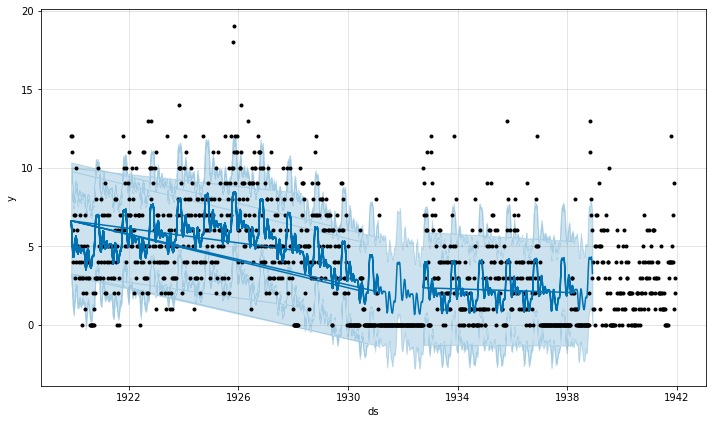

In [201]:
fig1 = prophet_model.plot(all_newsub_weekly_forecasts_dfs)

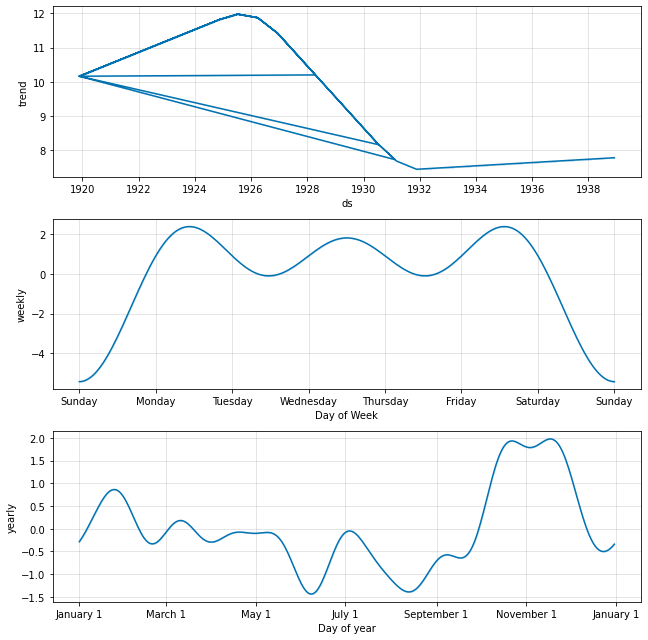

In [202]:
fig2 = prophet_model.plot_components(all_newsub_weekly_forecasts_dfs)

In [203]:
newsubs_base = alt.Chart(newmember_subscriptions_by_week).encode(
    alt.X('date:T', axis=alt.Axis(title='date'))
).properties(
    width=1200,
    height=275
)

newsubs_line = newsubs_base.mark_line().encode(
    alt.Y('total',
          axis=alt.Axis(title='new subscriptions per week'))
)

# draw rectangles to highlight logbook gaps
logbook_gaps_span = alt.Chart(logbook_gaps_df).encode(
     alt.X('start')
).properties(
    width=1200,
    height=275
).mark_rect(
    opacity=0.2, color="gray"
).encode(
    x='start',
    x2='end',
    y=alt.value(0),  # 0 pixels from bottom
    y2=alt.value(275)  # 300 pixels from top
)

newsubs_forecast_base = alt.Chart(forecasted_subscriptions).encode(
    alt.X('ds:T', axis=alt.Axis(title='date'))
).properties(
    width=1200,
    height=275
)

newsubs_forecast_line = newsubs_forecast_base.mark_line(color="orange").encode(
    alt.Y('yhat',
          axis=alt.Axis(title='new subscriptions per week'), scale=alt.Scale(domain=[0, 20])),
)
# .transform_filter(
    # alt.FieldLTPredicate(field='ds', lt=date(1919, 1,1))
# )

newsubs_area = newsubs_forecast_base.mark_area(opacity=0.3, color='orange').encode(
    alt.Y('yhat_upper',
          axis=alt.Axis(title=None), scale=alt.Scale(domain=[0, 20])),
    alt.Y2('yhat_lower')
)

# add newsubs last so it will be layered on top
newsubs_line + logbook_gaps_span + newsubs_area + newsubs_forecast_line

alt.LayerChart(...)

### forecast again, with growth and cap

the default forecast behavior is following a downward trend in the existing data leading into our later gaps, but based on the data afterwards that doesn't look right. 




In [204]:
# when is the largest week? 
growth_cap = newmember_subscriptions_by_week.total.max()
newmember_subscriptions_by_week[newmember_subscriptions_by_week.total == growth_cap]

,date,total
311,1925-11-08,19


In [205]:
newsub_weekly_growth_forecasts = forecast_missing_subscriptions(newmember_subscriptions_by_week, logbook_gaps, post1932_date, train_all_data=False, return_prophet_model=False, use_weekly_growth_cap=True)

15:51:52 - cmdstanpy - INFO - Chain [1] start processing


15:51:52 - cmdstanpy - INFO - Chain [1] done processing
15:51:52 - cmdstanpy - INFO - Chain [1] start processing
15:51:52 - cmdstanpy - INFO - Chain [1] done processing
15:51:53 - cmdstanpy - INFO - Chain [1] start processing
15:51:53 - cmdstanpy - INFO - Chain [1] done processing
15:51:53 - cmdstanpy - INFO - Chain [1] start processing
15:51:53 - cmdstanpy - INFO - Chain [1] done processing
15:51:53 - cmdstanpy - INFO - Chain [1] start processing
15:51:53 - cmdstanpy - INFO - Chain [1] done processing
15:51:54 - cmdstanpy - INFO - Chain [1] start processing
15:51:54 - cmdstanpy - INFO - Chain [1] done processing


In [206]:
chart_height = 275
gap_areas = plot_gap_areas(logbook_gaps, chart_height, include_line=False)
plot_newsubs_weekly_forecast(newsub_weekly_growth_forecasts, gap_areas, logbook_gaps, chart_height, post1932_date, show_model=False, separate_model_decades=False)

alt.LayerChart(...)

In [207]:
chart_height = 275
gap_areas = plot_gap_areas(logbook_gaps, chart_height, include_line=False)
plot_newsubs_weekly_forecast(newsub_weekly_growth_forecasts, gap_areas, logbook_gaps, chart_height, post1932_date, show_model=True, separate_model_decades=False)

alt.LayerChart(...)

### fit on all weeks, logistic growth

In [208]:
lognewsub_weeks_fcst = forecast_missing_subscriptions(newmember_subscriptions_by_week, logbook_gaps, post1932_date, train_all_data=True, return_prophet_model=False, use_weekly_growth_cap=True, use_total_growth_cap=True)

15:52:03 - cmdstanpy - INFO - Chain [1] start processing
15:52:03 - cmdstanpy - INFO - Chain [1] done processing
15:52:03 - cmdstanpy - INFO - Chain [1] start processing
15:52:03 - cmdstanpy - INFO - Chain [1] done processing
15:52:03 - cmdstanpy - INFO - Chain [1] start processing
15:52:03 - cmdstanpy - INFO - Chain [1] done processing
15:52:04 - cmdstanpy - INFO - Chain [1] start processing
15:52:04 - cmdstanpy - INFO - Chain [1] done processing
15:52:04 - cmdstanpy - INFO - Chain [1] start processing
15:52:04 - cmdstanpy - INFO - Chain [1] done processing
15:52:05 - cmdstanpy - INFO - Chain [1] start processing
15:52:05 - cmdstanpy - INFO - Chain [1] done processing
15:52:05 - cmdstanpy - INFO - Chain [1] start processing
15:52:05 - cmdstanpy - INFO - Chain [1] done processing


In [209]:
chart_height = 275
gap_areas = plot_gap_areas(logbook_gaps, chart_height, include_line=False)
plot_newsubs_weekly_forecast(lognewsub_weeks_fcst, gap_areas, logbook_gaps, chart_height, post1932_date, show_model=True, separate_model_decades=False)

alt.LayerChart(...)

### aggregate forecast values

In [129]:



onemonth = timedelta(days=31)
fivedays = timedelta(days=5)
oneday = timedelta(days=5)
oneweek = timedelta(days=7)

# newsub_member_total = len(subscription_first_events.member_id.unique())
# member_total = len(events_df.member_id.unique())

# allow overrides for aggregrating uniq name estimates
def aggregrate_missing_newsub_estimates(forecast_df, newmember_subscriptions_by_week=newmember_subscriptions_by_week, newsub_member_total=None, member_total=None):

  newsub_weekly_missing = 0
  newsub_weekly_missing_upper = 0
  newsub_weekly_missing_lower = 0

  if newsub_member_total is None:
    newsub_member_total = len(subscription_first_events.member_id.unique())
  if member_total is None:
    member_total = len(events_df.member_id.unique())


  newsub_weekly_estimates = []

  for i, gap in enumerate(logbook_gaps): 
    gap_start = gap['start']
    gap_end = gap['end']
    # print(gap_start, gap_end)
    # print('gap range ')
    gap_range = DateTimeRange(gap_start, gap_end)
    # print(gap_range)

    # get documented counts for this time period
    gap_counts = newmember_subscriptions_by_week[(newmember_subscriptions_by_week.date >= gap_start) & (newmember_subscriptions_by_week.date <= gap_end + oneweek)]
    # now get the forecast for the same weeks
    
    # weekly_forecast = newsub_weekly_forecasts_df[(newsub_weekly_forecasts_df.ds >= gap_start) & (newsub_weekly_forecasts_df.ds <= gap_end + oneweek)]

    weekly_forecast = forecast_df[(forecast_df.ds >= gap_start) & (forecast_df.ds <= gap_end + oneweek)]
    # print(weekly_forecast[['ds', 'yhat', 'yhat_upper', 'yhat_lower']].head())

    for week in gap_counts.itertuples():
      week_start = week.date 

      # do logbook weeks and forecast weeks match?
      # missing estimate is the forecast value minus any actual recorded count for this day
      documented_week = newmember_subscriptions_by_week[newmember_subscriptions_by_week.date == week.date]  #.iloc[0]
      # seems possible there's no documented week
      if documented_week.shape[0]:
        documented_week = documented_week.iloc[0]
      else: 
        documented_week = None

      # check if the padding put us past the end of the current gap
      if week_start > gap_end:
        continue

      # get the end of the same month (first of the next month minus one day)
      week_end = week_start + oneweek
      # how many days from this month overlap with our gap?
      gap_intersection = gap_range.intersection(DateTimeRange(week_start, week_end))
      overlap_days = gap_intersection.timedelta.days
      if overlap_days != 7:
        print('gap overlap for %s is %d days' % (week_end, overlap_days))
      # what is our threshold for using the forecast value instead of recorded? 
      # let's try 3 days
      if overlap_days > 3:
        week_total = 0
        if not documented_week.empty:
          week_total = week.total

        # get the forecast value for this week
        week_forecast = weekly_forecast[(weekly_forecast.ds >= week_start) & (weekly_forecast.ds <= week_end)].iloc[0]
        # missing estimate is the forecast value minus any actual recorded count for this month
        newsub_weekly_missing += max(0, (max(0, week_forecast.yhat) - week_total))
        newsub_weekly_missing_upper += (week_forecast.yhat_upper - week_total)
        # cap lower estimate at zero
        newsub_weekly_missing_lower += max(0, (max(0, week_forecast.yhat_lower) - week_total))

        # aggregate forecast values so we can output as csv for reference
        newsub_weekly_estimates.append({
            'date': week.date,
            'documented_total': week_total,
            'gap_days': overlap_days,
            'forecast': week_forecast.yhat,
            'forecast_upper': week_forecast.yhat_upper,
            'forecast_lower': week_forecast.yhat_lower,
            'forecast_range': week_forecast.yhat_upper - week_forecast.yhat_lower,
        })

        newsub_estimates_df = pd.DataFrame(newsub_weekly_estimates)
        newsub_estimates_df.to_csv('newsub_weekly_forecast.csv', index=False)

  print('''\n\nmissing estimates:
    %s
    upper: %s
    lower: %s''' % (newsub_weekly_missing, newsub_weekly_missing_upper, newsub_weekly_missing_lower))
  
  estimated_total = newsub_member_total + newsub_weekly_missing
  estimated_total_upper = newsub_member_total + newsub_weekly_missing_upper
  estimated_total_lower = newsub_member_total + newsub_weekly_missing_lower

  est_percent = (member_total / estimated_total ) * 100
  est_percent_upper = (member_total / estimated_total_upper ) * 100
  est_percent_lower = (member_total / estimated_total_lower ) * 100

  # summarize the result
  print('''
  total unique members: %d
  total members from first subscriptions: %d
  estimated missing subscriptions: %.2f (upper %.2f, lower %.2f)
  estimated total subscriptions from logbooks: %.2f (upper %.2f, lower %.2f)
  total missing: %d (upper %d, lower %d)
  estimated percent: %.2f (upper %.2f, lower %.2f)
  ''' % (member_total, newsub_member_total, 
         # estimated missing
          newsub_weekly_missing, newsub_weekly_missing_upper, newsub_weekly_missing_lower,
         # estimated total
          estimated_total, estimated_total_upper, estimated_total_lower, 
         # total missing
          max(0, estimated_total - member_total),
            estimated_total_upper - member_total,
          max(0, estimated_total_lower - member_total),
          est_percent, est_percent_upper, est_percent_lower
          ))
  
  # return (newsub_weekly_missing, newsub_weekly_missing_upper, newsub_weekly_missing_lower)
  
# newsub_missing, newsub_missing_upper, newsub_missing_lower = aggregrate_missing_newsub_estimates()

### summarize

In [130]:
# initial forecast, calculated the same way as membership activity
aggregrate_missing_newsub_estimates(newsub_weekly_forecasts)

gap overlap for 1928-03-04 00:00:00 is 3 days
gap overlap for 1930-06-08 00:00:00 is 0 days
gap overlap for 1931-01-04 00:00:00 is 3 days
gap overlap for 1932-10-02 00:00:00 is 0 days
gap overlap for 1938-02-20 00:00:00 is 3 days
gap overlap for 1938-10-23 00:00:00 is 4 days


missing estimates:
    458.1301470890682
    upper: 1134.6687585990046
    lower: 93.1204905972484

  total unique members: 5139
  total members from first subscriptions: 4320
  estimated missing subscriptions: 458.13 (upper 1134.67, lower 93.12)
  estimated total subscriptions from logbooks: 4778.13 (upper 5454.67, lower 4413.12)
  total missing: 0 (upper 315, lower 0)
  estimated percent: 107.55 (upper 94.21, lower 116.45)
  


In [131]:
# second forecast, fitting prophet on all data 
# - this result seems better than the first linear model
aggregrate_missing_newsub_estimates(newsub_weekly_forecasts_df)


gap overlap for 1928-03-04 00:00:00 is 3 days
gap overlap for 1930-06-08 00:00:00 is 0 days
gap overlap for 1931-01-04 00:00:00 is 3 days
gap overlap for 1932-10-02 00:00:00 is 0 days
gap overlap for 1938-02-20 00:00:00 is 3 days
gap overlap for 1938-10-23 00:00:00 is 4 days


missing estimates:
    497.6432206791749
    upper: 1222.2412955520426
    lower: 30.409885571171483

  total unique members: 5139
  total members from first subscriptions: 4320
  estimated missing subscriptions: 497.64 (upper 1222.24, lower 30.41)
  estimated total subscriptions from logbooks: 4817.64 (upper 5542.24, lower 4350.41)
  total missing: 0 (upper 403, lower 0)
  estimated percent: 106.67 (upper 92.72, lower 118.13)
  


In [132]:
# third forecast, with logistic growth and cap
aggregrate_missing_newsub_estimates(newsub_weekly_growth_forecasts)

gap overlap for 1928-03-04 00:00:00 is 3 days
gap overlap for 1930-06-08 00:00:00 is 0 days
gap overlap for 1931-01-04 00:00:00 is 3 days
gap overlap for 1932-10-02 00:00:00 is 0 days
gap overlap for 1938-02-20 00:00:00 is 3 days
gap overlap for 1938-10-23 00:00:00 is 4 days


missing estimates:
    1026.5126160682544
    upper: 1725.0101234296446
    lower: 368.1549436239217

  total unique members: 5139
  total members from first subscriptions: 4320
  estimated missing subscriptions: 1026.51 (upper 1725.01, lower 368.15)
  estimated total subscriptions from logbooks: 5346.51 (upper 6045.01, lower 4688.15)
  total missing: 207 (upper 906, lower 0)
  estimated percent: 96.12 (upper 85.01, lower 109.62)
  


## new members by first subscription, aggregated by unique name

In [210]:
member_events.head()

,event_type,member_id,date,source_type
671,Subscription,cahun,1919-11-17,Lending Library Card;Logbook
29914,Subscription,worthing,1919-11-17,Logbook
29915,Subscription,flot-marcelle,1919-11-17,Logbook
672,Subscription,regnier,1919-11-18,Logbook;Lending Library Card
676,Subscription,ulmann,1919-11-18,Logbook;Lending Library Card


In [134]:
# member events doesn't include names, so join to get it back in

events_df[['member_id', 'member_names', 'member_sort_names']]

,member_id,member_names,member_sort_names
0,linossier-raymonde,Raymonde Linossier,"Linossier, Raymonde"
1,garreta,Mme Garreta,"Garreta, Mme"
2,rhys,Mr. Rhys,"Rhys, Mr."
3,walsh,Ernest Walsh,"Walsh, Ernest"
4,lincoln-1,Mr. Lincoln,"Lincoln, Mr."
...,...,...,...
35518,gutmann-henri,Henri Gutmann,"Gutmann, Henri"
35519,bernheim-antoinette,Antoinette Bernheim,"Bernheim, Antoinette"
35520,baldwin-mr,Mr. Baldwin,"Baldwin, Mr."
35521,bernheim-antoinette,Antoinette Bernheim,"Bernheim, Antoinette"


In [135]:
member_uniqname_events = pd.merge(member_events, events_df[['member_id', 'member_names']], on='member_id')

In [136]:
member_uniqname_events

,event_type,member_id,date,source_type,member_names
0,Subscription,cahun,1919-11-17,Lending Library Card;Logbook,Claude Cahun / Mlle Lucie Schwob
1,Subscription,cahun,1919-11-17,Lending Library Card;Logbook,Claude Cahun / Mlle Lucie Schwob
2,Subscription,cahun,1919-11-17,Lending Library Card;Logbook,Claude Cahun / Mlle Lucie Schwob
3,Subscription,cahun,1919-11-17,Lending Library Card;Logbook,Claude Cahun / Mlle Lucie Schwob
4,Borrow,cahun,1919-11-19,Lending Library Card,Claude Cahun / Mlle Lucie Schwob
...,...,...,...,...,...
6784391,Subscription,azgema,1941-12-06,Logbook,Azgema
6784392,Subscription,godard,1941-12-09,Logbook,Godard
6784393,Subscription,godard,1941-12-09,Logbook,Godard
6784394,Renewal,kohlberg-8,1941-12-09,Logbook,Kohlberg


In [137]:
# go back to member events, limit to logbooks AND by event type, then group and get first event for each member
subscription_uniqname_first_events = member_uniqname_events[member_uniqname_events.source_type.str.contains('Logbook') & member_uniqname_events.event_type.isin(['Subscription', 'Renewal'])].groupby("member_names").first().reset_index()
subscription_uniqname_first_events

,member_names,event_type,member_id,date,source_type
0,"""Friend of Mlle Pottecher""",Subscription,pottecher-friend-of,1922-04-08,Logbook
1,"""Friend of Renoir""",Subscription,friend-of-renoir,1920-12-06,Logbook
2,A. Bigorie,Subscription,bigorie,1929-10-11,Logbook
3,A. Clarke,Subscription,clarke-a,1925-10-21,Logbook;Address Book
4,A. Derevianko,Subscription,derevianko,1933-07-04,Logbook;Address Book
...,...,...,...,...,...
3970,van Altena,Subscription,van-altena,1934-05-12,Logbook
3971,van Leeuhof,Renewal,van-leeuhof,1928-05-18,Logbook
3972,van Zyl,Subscription,van-zyl,1935-10-25,Logbook
3973,Édouard Roditi,Subscription,roditi-edouard,1928-05-18,Logbook;Lending Library Card


In [138]:
# get new member monthly count based only on subscriptions, so we can forecast with prophet
newmember_uniqname_subscriptions_by_week = subscription_uniqname_first_events.groupby([pd.Grouper(key='date', freq='W')])['member_names'].count().reset_index()
newmember_uniqname_subscriptions_by_week.rename(columns={'member_names': 'total'}, inplace=True)
newmember_uniqname_subscriptions_by_week

,date,total
0,1919-11-23,12
1,1919-11-30,11
2,1919-12-07,12
3,1919-12-14,6
4,1919-12-21,4
...,...,...
1147,1941-11-16,4
1148,1941-11-23,1
1149,1941-11-30,9
1150,1941-12-07,3


### prophet on new subscriptions by uniq name

In [139]:
from datetime import date, timedelta
import math

from prophet import Prophet

post1932 = pd.to_datetime(date(1932, 9, 27))


def growth_forecast_missing_uniqname_newsubs():
  # show some number of months before/after the gap and forecast
  oneweek = timedelta(days=7)
  sixweeks = timedelta(days=7*6)

  # lists to aggregate forecasts and models
  all_newsub_weekly_forecasts_dfs = []

  # there's a significant difference between 1920s and 1930s data,
  # and there's a big gap in 1931-1932
  # for gaps after 1936, only include counts after the 1932 gap
  #   February 16 1931 to September 26 1932 (588 days)
  #   December 31 1936 to February 17 1938 (413 days)

  post1932 = pd.to_datetime(date(1932, 9, 27))

  # use largest week across all data as our growth cap
  growth_cap = newmember_uniqname_subscriptions_by_week.total.max()
  print('max from all data is %s' % growth_cap)


  for i, gap in enumerate(logbook_gaps):
    weekly_m = Prophet(growth='logistic', weekly_seasonality=True)  # use logistic growth instead of linear
    gap_start = gap['start']
    gap_end = gap['end']
    print('forecasting %s' % gap)

    preceding_data = newmember_uniqname_subscriptions_by_week[newmember_uniqname_subscriptions_by_week.date < gap_start]

    # for late gaps, only include counts after september 1932
    if gap_start.year >= 1936:
      preceding_data = preceding_data[preceding_data.date >= post1932 ]

    # drop any zeroes, so prophet doesn't fit to missing data
    preceding_data = preceding_data[preceding_data.total.gt(0)]

    # rename monthly count columns for prophet and fit the data
    data_to_fit = preceding_data.rename(columns={'date': 'ds', 'total': 'y'})
    data_to_fit['floor'] = 0
    # (should this be max from current data or next? or both? or all?)
    data_to_fit['cap'] = growth_cap
    weekly_m.fit(data_to_fit)

    # make a future dataframe to cover the gap 
    # (need at least 1 extra; may want to add more while testing)
    forecast_for = math.ceil(gap['days']/ 7) + 7
    print('gap is %s days, forecast for %d weeks' % (gap['days'], forecast_for))
    newsub_weeks_future = weekly_m.make_future_dataframe(periods=forecast_for, freq='W')

    # post_gap_data = newmember_subscriptions_by_week[newmember_subscriptions_by_week.date > gap_end][newmember_subscriptions_by_week.date < (gap_end + sixweeks)]
    newsub_weeks_future['floor'] = 0
    newsub_weeks_future['cap'] = growth_cap
    newsub_weeks_fcst = weekly_m.predict(newsub_weeks_future)

    # plot the forecast around our gap
    forecast_near_gap = newsub_weeks_fcst[(newsub_weeks_fcst.ds > (gap_start - oneweek)) & (newsub_weeks_fcst.ds < (gap_end + oneweek))]
    display(forecast_near_gap.head())
    # all_gap_forecasts_dfs.append(forecast_near_gap)

    newsub_weekly_count_near_gap = newmember_subscriptions_by_week[(newmember_subscriptions_by_week.date > (gap_start - oneweek)) & (newmember_subscriptions_by_week.date < (gap_end + oneweek))]

    forecast_near_gap = newsub_weeks_fcst[(newsub_weeks_fcst.ds > (gap_start - oneweek)) & (newsub_weeks_fcst.ds < (gap_end + oneweek))]

    all_newsub_weekly_forecasts_dfs.append(newsub_weeks_fcst.copy())

  # combine all the forecasts into a single df
  newsub_weekly_forecasts_dfs = pd.concat(all_newsub_weekly_forecasts_dfs)
  # all_gap_forecasts = pd.concat(all_gap_forecasts_dfs)

  return newsub_weekly_forecasts_dfs


uniqname_newsub_weekly_growth_forecasts = growth_forecast_missing_uniqname_newsubs()
uniqname_newsub_weekly_growth_forecasts

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/6p995tb4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/qdyss79p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44051', 'data', 'file=/tmp/tmp1mhj93z6/6p995tb4.json', 'init=/tmp/tmp1mhj93z6/qdyss79p.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_modelf4l2x8us/prophet_model-20230113173030.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:30:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:30:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


max from all data is 19
forecasting {'start': Timestamp('1928-01-01 00:00:00'), 'end': Timestamp('1928-02-29 00:00:00'), 'days': 59}
gap is 59 days, forecast for 16 weeks


,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
412,1928-01-01,0.005295,19,0,1.791260,8.591768,0.005295,0.005295,5.219849,5.219849,...,5.640898,5.640898,5.640898,-0.421049,-0.421049,-0.421049,0.0,0.0,0.0,5.225144
413,1928-01-08,0.005253,19,0,1.865917,9.017731,0.005253,0.005253,5.514551,5.514551,...,5.640898,5.640898,5.640898,-0.126347,-0.126347,-0.126347,0.0,0.0,0.0,5.519804
414,1928-01-15,0.005211,19,0,2.664684,9.387091,0.005211,0.005211,6.070031,6.070031,...,5.640898,5.640898,5.640898,0.429133,0.429133,0.429133,0.0,0.0,0.0,6.075243
415,1928-01-22,0.005170,19,0,3.169437,9.907832,0.005170,0.005170,6.681672,6.681672,...,5.640898,5.640898,5.640898,1.040774,1.040774,1.040774,0.0,0.0,0.0,6.686842
416,1928-01-29,0.005129,19,0,3.658517,10.278256,0.005129,0.005129,6.881189,6.881189,...,5.640898,5.640898,5.640898,1.240291,1.240291,1.240291,0.0,0.0,0.0,6.886319


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


forecasting {'start': Timestamp('1930-01-03 00:00:00'), 'end': Timestamp('1930-06-01 00:00:00'), 'days': 149}


DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/t255q4wu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/pikw01ll.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=35497', 'data', 'file=/tmp/tmp1mhj93z6/t255q4wu.json', 'init=/tmp/tmp1mhj93z6/pikw01ll.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_modeladj3xifq/prophet_model-20230113173032.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:30:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:30:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 149 days, forecast for 29 weeks


,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
504,1929-12-29,9.752559,19,0,2.099270,8.574526,9.752559,9.752559,-4.583566,-4.583566,...,-4.01435,-4.01435,-4.01435,-0.569216,-0.569216,-0.569216,0.0,0.0,0.0,5.168993
505,1930-01-05,9.753037,19,0,2.147130,8.563613,9.753037,9.753037,-4.352077,-4.352077,...,-4.01435,-4.01435,-4.01435,-0.337726,-0.337726,-0.337726,0.0,0.0,0.0,5.400961
506,1930-01-12,9.753515,19,0,2.675548,9.537228,9.753515,9.753515,-3.780307,-3.780307,...,-4.01435,-4.01435,-4.01435,0.234044,0.234044,0.234044,0.0,0.0,0.0,5.973209
507,1930-01-19,9.753993,19,0,3.438313,9.899073,9.753994,9.753994,-3.079843,-3.079843,...,-4.01435,-4.01435,-4.01435,0.934507,0.934507,0.934507,0.0,0.0,0.0,6.674150
508,1930-01-26,9.754471,19,0,3.484817,10.372228,9.754472,9.754472,-2.724684,-2.724684,...,-4.01435,-4.01435,-4.01435,1.289667,1.289667,1.289667,0.0,0.0,0.0,7.029788


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/fjdy94fe.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/4cnh_luu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52375', 'data', 'file=/tmp/tmp1mhj93z6/fjdy94fe.json', 'init=/tmp/tmp1mhj93z6/4cnh_luu.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_modelena7difz/prophet_model-20230113173034.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:30:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


forecasting {'start': Timestamp('1930-08-01 00:00:00'), 'end': Timestamp('1930-12-31 00:00:00'), 'days': 152}


17:30:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 152 days, forecast for 29 weeks


,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
515,1930-07-27,0.008231,19,0,1.383493,7.665731,0.008231,0.008231,4.626648,4.626648,...,5.462615,5.462615,5.462615,-0.835967,-0.835967,-0.835967,0.0,0.0,0.0,4.634879
516,1930-08-03,0.008182,19,0,1.286578,7.654682,0.008182,0.008182,4.487512,4.487512,...,5.462615,5.462615,5.462615,-0.975103,-0.975103,-0.975103,0.0,0.0,0.0,4.495695
517,1930-08-10,0.008134,19,0,0.986665,7.558789,0.008134,0.008134,4.258427,4.258427,...,5.462615,5.462615,5.462615,-1.204188,-1.204188,-1.204188,0.0,0.0,0.0,4.266561
518,1930-08-17,0.008086,19,0,0.947864,7.439297,0.008086,0.008086,4.173913,4.173913,...,5.462615,5.462615,5.462615,-1.288702,-1.288702,-1.288702,0.0,0.0,0.0,4.181999
519,1930-08-24,0.008038,19,0,1.182762,7.553669,0.008038,0.008038,4.464408,4.464408,...,5.462615,5.462615,5.462615,-0.998207,-0.998207,-0.998207,0.0,0.0,0.0,4.472446


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/6auv17h1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/shi6tvbn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=82242', 'data', 'file=/tmp/tmp1mhj93z6/6auv17h1.json', 'init=/tmp/tmp1mhj93z6/shi6tvbn.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_modelfzp8mgec/prophet_model-20230113173035.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:30:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


forecasting {'start': Timestamp('1931-02-17 00:00:00'), 'end': Timestamp('1932-09-25 00:00:00'), 'days': 586}


17:30:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 586 days, forecast for 91 weeks


,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
520,1931-02-15,9.170123,19,0,1.542492,8.154131,9.170123,9.170123,-4.368606,-4.368606,...,-3.944557,-3.944557,-3.944557,-0.424049,-0.424049,-0.424049,0.0,0.0,0.0,4.801516
521,1931-02-22,9.169126,19,0,1.340182,8.024864,9.169126,9.169126,-4.418086,-4.418086,...,-3.944557,-3.944557,-3.944557,-0.473529,-0.473529,-0.473529,0.0,0.0,0.0,4.751040
522,1931-03-01,9.168130,19,0,1.736807,8.254718,9.168130,9.168130,-4.081685,-4.081685,...,-3.944557,-3.944557,-3.944557,-0.137128,-0.137128,-0.137128,0.0,0.0,0.0,5.086445
523,1931-03-08,9.167134,19,0,1.857271,8.633529,9.167134,9.167134,-3.934804,-3.934804,...,-3.944557,-3.944557,-3.944557,0.009753,0.009753,0.009753,0.0,0.0,0.0,5.232330
524,1931-03-15,9.166138,19,0,1.591881,8.255391,9.166138,9.166138,-4.236643,-4.236643,...,-3.944557,-3.944557,-3.944557,-0.292086,-0.292086,-0.292086,0.0,0.0,0.0,4.929494


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/gj8np_od.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/zfu39s9t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=11153', 'data', 'file=/tmp/tmp1mhj93z6/gj8np_od.json', 'init=/tmp/tmp1mhj93z6/zfu39s9t.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_modelz54e3lbn/prophet_model-20230113173036.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:30:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:30:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


forecasting {'start': Timestamp('1937-01-01 00:00:00'), 'end': Timestamp('1938-02-16 00:00:00'), 'days': 411}
gap is 411 days, forecast for 66 weeks


,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
180,1936-12-27,6.759764,19,0,-0.833926,4.825098,6.759764,6.759764,-4.716568,-4.716568,...,-4.078935,-4.078935,-4.078935,-0.637633,-0.637633,-0.637633,0.0,0.0,0.0,2.043195
181,1937-01-03,6.752809,19,0,0.068987,5.512307,6.752809,6.752809,-4.056431,-4.056431,...,-4.078935,-4.078935,-4.078935,0.022504,0.022504,0.022504,0.0,0.0,0.0,2.696378
182,1937-01-10,6.745858,19,0,0.542895,6.146078,6.745858,6.745858,-3.324434,-3.324434,...,-4.078935,-4.078935,-4.078935,0.754500,0.754500,0.754500,0.0,0.0,0.0,3.421423
183,1937-01-17,6.738909,19,0,1.264404,6.867653,6.738909,6.738909,-2.695111,-2.695111,...,-4.078935,-4.078935,-4.078935,1.383824,1.383824,1.383824,0.0,0.0,0.0,4.043798
184,1937-01-24,6.731964,19,0,1.643862,7.051277,6.731964,6.731965,-2.442248,-2.442248,...,-4.078935,-4.078935,-4.078935,1.636687,1.636687,1.636687,0.0,0.0,0.0,4.289716


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/0pco9u_7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/pzymdtds.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=170', 'data', 'file=/tmp/tmp1mhj93z6/0pco9u_7.json', 'init=/tmp/tmp1mhj93z6/pzymdtds.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_modeln3arnzir/prophet_model-20230113173037.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:30:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:30:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


forecasting {'start': Timestamp('1938-05-06 00:00:00'), 'end': Timestamp('1938-10-20 00:00:00'), 'days': 167}
gap is 167 days, forecast for 31 weeks


,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
191,1938-05-01,0.133276,19,0,-0.530135,4.673330,0.133276,0.133276,1.941952,1.941952,...,2.596829,2.596829,2.596829,-0.654876,-0.654876,-0.654876,0.0,0.0,0.0,2.075228
192,1938-05-08,0.132014,19,0,-0.211455,4.887717,0.132014,0.132014,2.258864,2.258864,...,2.596829,2.596829,2.596829,-0.337965,-0.337965,-0.337965,0.0,0.0,0.0,2.390878
193,1938-05-15,0.130763,19,0,-0.060837,5.091487,0.130763,0.130763,2.449531,2.449531,...,2.596829,2.596829,2.596829,-0.147298,-0.147298,-0.147298,0.0,0.0,0.0,2.580294
194,1938-05-22,0.129525,19,0,-0.241234,4.931200,0.129525,0.129525,2.238528,2.238528,...,2.596829,2.596829,2.596829,-0.358301,-0.358301,-0.358301,0.0,0.0,0.0,2.368052
195,1938-05-29,0.128298,19,0,-0.872727,4.304931,0.128298,0.128298,1.652321,1.652321,...,2.596829,2.596829,2.596829,-0.944508,-0.944508,-0.944508,0.0,0.0,0.0,1.780619


,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1919-11-23,0.151177,19,0,4.251138,11.373287,0.151177,0.151177,7.664273,7.664273,...,5.640898,5.640898,5.640898,2.023375,2.023375,2.023375,0.0,0.0,0.0,7.815450
1,1919-11-30,0.149991,19,0,3.926847,10.813348,0.149991,0.149991,6.978055,6.978055,...,5.640898,5.640898,5.640898,1.337156,1.337156,1.337156,0.0,0.0,0.0,7.128045
2,1919-12-07,0.148813,19,0,2.908907,9.611318,0.148813,0.148813,6.042772,6.042772,...,5.640898,5.640898,5.640898,0.401874,0.401874,0.401874,0.0,0.0,0.0,6.191586
3,1919-12-14,0.147645,19,0,2.367310,9.034588,0.147645,0.147645,5.367519,5.367519,...,5.640898,5.640898,5.640898,-0.273380,-0.273380,-0.273380,0.0,0.0,0.0,5.515164
4,1919-12-21,0.146486,19,0,1.710030,8.508330,0.146486,0.146486,5.120228,5.120228,...,5.640898,5.640898,5.640898,-0.520671,-0.520671,-0.520671,0.0,0.0,0.0,5.266714
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
218,1938-11-06,0.103058,19,0,1.372352,6.600097,0.103058,0.103058,3.822833,3.822833,...,2.596829,2.596829,2.596829,1.226004,1.226004,1.226004,0.0,0.0,0.0,3.925890
219,1938-11-13,0.102080,19,0,2.033216,7.561100,0.102080,0.102080,4.700816,4.700816,...,2.596829,2.596829,2.596829,2.103987,2.103987,2.103987,0.0,0.0,0.0,4.802896
220,1938-11-20,0.101112,19,0,2.442073,7.772646,0.101112,0.101112,4.914201,4.914201,...,2.596829,2.596829,2.596829,2.317372,2.317372,2.317372,0.0,0.0,0.0,5.015312
221,1938-11-27,0.100153,19,0,1.624079,6.812784,0.100153,0.100153,4.134660,4.134660,...,2.596829,2.596829,2.596829,1.537832,1.537832,1.537832,0.0,0.0,0.0,4.234813


In [140]:
plot_newsubs_weekly_forecast(uniqname_newsub_weekly_growth_forecasts, show_model=False, separate_model_decades=False, newmember_subscriptions_by_week=newmember_uniqname_subscriptions_by_week)


<ipython-input-120-8f0cb2a82ba7>:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gap_forecast['label'] = 'forecast'


alt.LayerChart(...)

In [141]:
plot_newsubs_weekly_forecast(uniqname_newsub_weekly_growth_forecasts, show_model=True, separate_model_decades=False, newmember_subscriptions_by_week=newmember_uniqname_subscriptions_by_week)


<ipython-input-120-8f0cb2a82ba7>:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gap_forecast['label'] = 'forecast'


alt.LayerChart(...)

### summarize


In [142]:
uniqname_newsub_member_total = len(subscription_uniqname_first_events.member_names.unique())
uniqname_newsub_member_total

3975

In [143]:
uniqname_member_total = len(events_df.member_names.unique())
uniqname_member_total

4720

In [144]:

aggregrate_missing_newsub_estimates(uniqname_newsub_weekly_growth_forecasts, newmember_subscriptions_by_week=newmember_uniqname_subscriptions_by_week, newsub_member_total=uniqname_newsub_member_total, member_total=uniqname_member_total)


gap overlap for 1928-03-04 00:00:00 is 3 days
gap overlap for 1930-06-08 00:00:00 is 0 days
gap overlap for 1931-01-04 00:00:00 is 3 days
gap overlap for 1932-10-02 00:00:00 is 0 days
gap overlap for 1938-02-20 00:00:00 is 3 days
gap overlap for 1938-10-23 00:00:00 is 4 days


missing estimates:
    899.1318059409615
    upper: 1564.089562296037
    lower: 286.08203330132824

  total unique members: 4720
  total members from first subscriptions: 3975
  estimated missing subscriptions: 899.13 (upper 1564.09, lower 286.08)
  estimated total subscriptions from logbooks: 4874.13 (upper 5539.09, lower 4261.08)
  total missing: 154 (upper 819, lower 0)
  estimated percent: 96.84 (upper 85.21, lower 110.77)
  


## recalculate Kevin's simpler missing member estimate


In [145]:
total_accounts = len(events_df.member_uris.unique())
total_logbook_accounts = len(logbook_events_df.member_uris.unique())
total_logbook_events = logbook_events_df.shape[0]

# new member per logbook event
n_accounts_per_logbook_event = total_logbook_accounts / total_logbook_events

# estimated total number of logbook events
# from prophet:
#  13,955 events (upper 15,220; lower 12,358
# from KM estimate: 13,597

est_total_logbook_events = 13955
est_total_logbook_events_upper = 15220
est_total_logbook_events_lower = 12358


est_logbook_accounts = est_total_logbook_events * n_accounts_per_logbook_event
est_logbook_accounts_upper = est_total_logbook_events_upper * n_accounts_per_logbook_event
est_logbook_accounts_lower = est_total_logbook_events_lower * n_accounts_per_logbook_event


n_missing_accounts = int(est_logbook_accounts - total_accounts)
n_missing_accounts_upper = int(est_logbook_accounts_upper - total_accounts)
n_missing_accounts_lower = int(est_logbook_accounts_lower - total_accounts)


# how many accounts do we have 
percent_surviving_accounts = (total_accounts / est_logbook_accounts) * 100
percent_surviving_accounts_upper = (total_accounts / est_logbook_accounts_upper) * 100
percent_surviving_accounts_lower = (total_accounts / est_logbook_accounts_lower) * 100


print("""
total accounts: %d
total accounts from logbooks: %d:
total logbook events: %d
new member per logbook event: %.2f
est total members from logbooks: %.2f (upper %.2f, lower %.2f)
est missing accounts: %.2f (upper %.2f, lower %.2f)
percent covered: %.2f (upper %.2f, lower %.2f)
percent missing: 
""" % (
    total_accounts,
    total_logbook_accounts,
    total_logbook_events,
    n_accounts_per_logbook_event,
    # est total members
    est_logbook_accounts, est_logbook_accounts_upper, est_logbook_accounts_lower,
    n_missing_accounts, n_missing_accounts_upper, n_missing_accounts_lower,
    percent_surviving_accounts, percent_surviving_accounts_upper, percent_surviving_accounts_lower
))


total accounts: 5139
total accounts from logbooks: 4604:
total logbook events: 11601
new member per logbook event: 0.40
est total members from logbooks: 5538.21 (upper 6040.24, lower 4904.42)
est missing accounts: 399.00 (upper 901.00, lower -234.00)
percent covered: 92.79 (upper 85.08, lower 104.78)
percent missing: 



In [146]:
len(events_df.member_uris.unique())

5139

In [147]:
len(events_df.member_names.unique())  # use this one, since it includes titles and merges slightly fewer accounts

4720

In [148]:
len(events_df.member_sort_names.unique())

4714

In [149]:
def simple_missing_member_est_collapsed():
  # group by name instead of id
  total_accounts = len(events_df.member_names.unique())
  total_logbook_accounts = len(logbook_events_df.member_names.unique())
  total_logbook_events = logbook_events_df.shape[0]

  # new member per logbook event
  n_accounts_per_logbook_event = total_logbook_accounts / total_logbook_events

  # estimated total number of logbook events
  # from prophet:
  #  13,955 events (upper 15,220; lower 12,358
  # from KM estimate: 13,597

  est_total_logbook_events = 13955
  est_total_logbook_events_upper = 15220
  est_total_logbook_events_lower = 12358


  est_logbook_accounts = est_total_logbook_events * n_accounts_per_logbook_event
  est_logbook_accounts_upper = est_total_logbook_events_upper * n_accounts_per_logbook_event
  est_logbook_accounts_lower = est_total_logbook_events_lower * n_accounts_per_logbook_event


  n_missing_accounts = int(est_logbook_accounts - total_accounts)
  n_missing_accounts_upper = int(est_logbook_accounts_upper - total_accounts)
  n_missing_accounts_lower = int(est_logbook_accounts_lower - total_accounts)


  # how many accounts do we have 
  percent_surviving_accounts = (total_accounts / est_logbook_accounts) * 100
  percent_surviving_accounts_upper = (total_accounts / est_logbook_accounts_upper) * 100
  percent_surviving_accounts_lower = (total_accounts / est_logbook_accounts_lower) * 100


  print("""
  ** counting by unique name instead of member id**
  total accounts: %d
  total accounts from logbooks: %d:
  total logbook events: %d
  new member per logbook event: %.2f
  est total members from logbooks: %.2f (upper %.2f, lower %.2f)
  est missing accounts: %.2f (upper %.2f, lower %.2f)
  percent covered: %.2f (upper %.2f, lower %.2f)
  """ % (
      total_accounts,
      total_logbook_accounts,
      total_logbook_events,
      n_accounts_per_logbook_event,
      # est total members
      est_logbook_accounts, est_logbook_accounts_upper, est_logbook_accounts_lower,
      n_missing_accounts, n_missing_accounts_upper, n_missing_accounts_lower,
      percent_surviving_accounts, percent_surviving_accounts_upper, percent_surviving_accounts_lower
  ))


simple_missing_member_est_collapsed()


  ** counting by unique name instead of member id**
  total accounts: 4720
  total accounts from logbooks: 4200:
  total logbook events: 11601
  new member per logbook event: 0.36
  est total members from logbooks: 5052.24 (upper 5510.21, lower 4474.06)
  est missing accounts: 332.00 (upper 790.00, lower -245.00)
  percent covered: 93.42 (upper 85.66, lower 105.50)
  


In [150]:
# why is Kevin's number for unique members different than mine? more than just shared accounts

members_df = pd.read_csv(csv_urls['members'])

In [151]:
members_df.uri.describe()

count                                                  5235
unique                                                 5235
top       https://shakespeareandco.princeton.edu/members...
freq                                                      1
Name: uri, dtype: object

In [152]:
events_df.member_uris.describe()

count                                                 35523
unique                                                 5139
top       https://shakespeareandco.princeton.edu/members...
freq                                                   1523
Name: member_uris, dtype: object

In [153]:
events_df[events_df.member_uris.str.contains(';')].member_uris.describe()

count                                                   557
unique                                                   49
top       https://shakespeareandco.princeton.edu/members...
freq                                                    256
Name: member_uris, dtype: object

In [154]:
# unique accounts from events + number of shared events
5139 + 49

5188

In [155]:
# where is the difference between that number and the 5235 total from members dataset?

# missing borrowing activity

In [156]:
# subset data for only those with complete start and end dates
date_events = events_df[(events_df.start_date.str.len() > 9) & (events_df.end_date.str.len() > 9)].copy()
# turn start/end dates into datetimes
date_events['start_datetime'] = pd.to_datetime(date_events.start_date, format='%Y-%m-%d', errors='ignore')
date_events['end_datetime'] = pd.to_datetime(date_events.end_date, format='%Y-%m-%d', errors='ignore')
date_events = date_events.sort_values(by=['start_datetime'])
date_events.head()

,event_type,start_date,end_date,member_uris,member_names,member_sort_names,subscription_price_paid,subscription_deposit,subscription_duration,subscription_duration_days,...,source_type,source_citation,source_manifest,source_image,first_member_uri,second_member_uri,member_id,item_id,start_datetime,end_datetime
671,Subscription,1919-11-17,1919-12-17,https://shakespeareandco.princeton.edu/members...,Claude Cahun / Mlle Lucie Schwob,"Cahun, Claude",4.0,NaN,1 month,30.0,...,Lending Library Card;Logbook,"Sylvia Beach, Lucie Schwob Lending Library Car...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/3a...,https://shakespeareandco.princeton.edu/members...,None,cahun,None,1919-11-17,1919-12-17
29915,Subscription,1919-11-17,1920-11-17,https://shakespeareandco.princeton.edu/members...,Marcelle Flot,"Flot, Marcelle",28.0,NaN,1 year,366.0,...,Logbook,"Sylvia Beach, Logbooks 1919–1941, Sylvia Beach...",NaN,NaN,https://shakespeareandco.princeton.edu/members...,None,flot-marcelle,None,1919-11-17,1920-11-17
29914,Subscription,1919-11-17,1920-02-17,https://shakespeareandco.princeton.edu/members...,Mrs. Worthing,"Worthing, Mrs.",12.0,NaN,3 months,92.0,...,Logbook,"Sylvia Beach, Logbooks 1919–1941, Sylvia Beach...",NaN,NaN,https://shakespeareandco.princeton.edu/members...,None,worthing,None,1919-11-17,1920-02-17
674,Borrow,1919-11-18,1919-11-28,https://shakespeareandco.princeton.edu/members...,Denise Ulmann,"Ulmann, Denise",NaN,NaN,NaN,NaN,...,Lending Library Card,"Sylvia Beach, Mlle Denise Ulmann Lending Libra...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/86...,https://shakespeareandco.princeton.edu/members...,None,ulmann,wilde-profundis,1919-11-18,1919-11-28
29916,Subscription,1919-11-18,1920-05-18,https://shakespeareandco.princeton.edu/members...,Anne Evans,"Evans, Anne",35.0,14.0,6 months,182.0,...,Logbook,"Sylvia Beach, Logbooks 1919–1941, Sylvia Beach...",NaN,NaN,https://shakespeareandco.princeton.edu/members...,None,evans-anne,None,1919-11-18,1920-05-18


In [157]:
# borrow events 
borrow_events = date_events[date_events.event_type == 'Borrow']

# subset data for subscription events with complete dates
subscription_events = date_events[date_events.event_type.isin(['Subscription', 'Renewal', 'Supplement'])].copy()

In [158]:
# some subscriptions (~377) do not have subscription volume documented;
# subscription volume is 1 at minumim
subscription_events["subscription_volumes"] = subscription_events.subscription_volumes.apply(lambda x: x if pd.notna(x) else 1)

In [159]:
# date range for subscriptions
earliest_date = date_events.start_datetime.iloc[0]
# end date for the last subscription
subs_end_date = subscription_events.end_datetime.max()

In [160]:
# load members
members_df = pd.read_csv(csv_urls['members'])

# for now, use has card to identify borrows that belong to subscriptions (but this is approximate)
member_subs = subscription_events.copy()
member_subs[['first_member_uri','second_member_uri']] = member_subs.member_uris.str.split(';', expand=True)
# handle multiple member uris (joint accounts) in subscriptions by merging on the first one (has card should be same)
member_subs = pd.merge(left=member_subs, right=members_df, left_on="first_member_uri", right_on="uri")
member_subs = member_subs[member_subs.has_card]


In [161]:
# make a copy of the dataframe so pandas won't complain about setting values on a slice
subscriptions_df = subscription_events.copy()

def borrows_within_sub(subscription):
  # identify and count any borrow events that *start* during this subscription
  # (do we want start or any overlap? start matters more when estimating book events)
  return len(borrow_events[(borrow_events.member_id == subscription.member_id) & 
              (subscription.start_date <= borrow_events.start_date) & (borrow_events.start_date <= subscription.end_date)])

subscriptions_df['documented_borrows'] = subscriptions_df.apply(borrows_within_sub, axis=1)
subscriptions_df.head()

,event_type,start_date,end_date,member_uris,member_names,member_sort_names,subscription_price_paid,subscription_deposit,subscription_duration,subscription_duration_days,...,source_citation,source_manifest,source_image,first_member_uri,second_member_uri,member_id,item_id,start_datetime,end_datetime,documented_borrows
671,Subscription,1919-11-17,1919-12-17,https://shakespeareandco.princeton.edu/members...,Claude Cahun / Mlle Lucie Schwob,"Cahun, Claude",4.0,NaN,1 month,30.0,...,"Sylvia Beach, Lucie Schwob Lending Library Car...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/3a...,https://shakespeareandco.princeton.edu/members...,None,cahun,None,1919-11-17,1919-12-17,3
29915,Subscription,1919-11-17,1920-11-17,https://shakespeareandco.princeton.edu/members...,Marcelle Flot,"Flot, Marcelle",28.0,NaN,1 year,366.0,...,"Sylvia Beach, Logbooks 1919–1941, Sylvia Beach...",NaN,NaN,https://shakespeareandco.princeton.edu/members...,None,flot-marcelle,None,1919-11-17,1920-11-17,0
29914,Subscription,1919-11-17,1920-02-17,https://shakespeareandco.princeton.edu/members...,Mrs. Worthing,"Worthing, Mrs.",12.0,NaN,3 months,92.0,...,"Sylvia Beach, Logbooks 1919–1941, Sylvia Beach...",NaN,NaN,https://shakespeareandco.princeton.edu/members...,None,worthing,None,1919-11-17,1920-02-17,0
29916,Subscription,1919-11-18,1920-05-18,https://shakespeareandco.princeton.edu/members...,Anne Evans,"Evans, Anne",35.0,14.0,6 months,182.0,...,"Sylvia Beach, Logbooks 1919–1941, Sylvia Beach...",NaN,NaN,https://shakespeareandco.princeton.edu/members...,None,evans-anne,None,1919-11-18,1920-05-18,0
672,Subscription,1919-11-18,1919-12-18,https://shakespeareandco.princeton.edu/members...,Henri Regnier,"Regnier, Henri",4.0,5.6,1 month,30.0,...,"Sylvia Beach, Logbooks 1919–1941, Sylvia Beach...",;https://figgy.princeton.edu/concern/scanned_r...,;https://iiif.princeton.edu/loris/figgy_prod/c...,https://shakespeareandco.princeton.edu/members...,None,regnier,None,1919-11-18,1919-12-18,1


In [162]:
# check — example subscriptions with no borrows
subscriptions_df[subscriptions_df.documented_borrows == 0].head()

,event_type,start_date,end_date,member_uris,member_names,member_sort_names,subscription_price_paid,subscription_deposit,subscription_duration,subscription_duration_days,...,source_citation,source_manifest,source_image,first_member_uri,second_member_uri,member_id,item_id,start_datetime,end_datetime,documented_borrows
29915,Subscription,1919-11-17,1920-11-17,https://shakespeareandco.princeton.edu/members...,Marcelle Flot,"Flot, Marcelle",28.0,NaN,1 year,366.0,...,"Sylvia Beach, Logbooks 1919–1941, Sylvia Beach...",NaN,NaN,https://shakespeareandco.princeton.edu/members...,None,flot-marcelle,None,1919-11-17,1920-11-17,0
29914,Subscription,1919-11-17,1920-02-17,https://shakespeareandco.princeton.edu/members...,Mrs. Worthing,"Worthing, Mrs.",12.0,NaN,3 months,92.0,...,"Sylvia Beach, Logbooks 1919–1941, Sylvia Beach...",NaN,NaN,https://shakespeareandco.princeton.edu/members...,None,worthing,None,1919-11-17,1920-02-17,0
29916,Subscription,1919-11-18,1920-05-18,https://shakespeareandco.princeton.edu/members...,Anne Evans,"Evans, Anne",35.0,14.0,6 months,182.0,...,"Sylvia Beach, Logbooks 1919–1941, Sylvia Beach...",NaN,NaN,https://shakespeareandco.princeton.edu/members...,None,evans-anne,None,1919-11-18,1920-05-18,0
677,Subscription,1919-11-18,1919-12-18,https://shakespeareandco.princeton.edu/members...,M. Keller,"Keller, M.",5.0,7.0,1 month,30.0,...,"Sylvia Beach, Logbooks 1919–1941, Sylvia Beach...",NaN,NaN,https://shakespeareandco.princeton.edu/members...,None,keller-m,None,1919-11-18,1919-12-18,0
681,Subscription,1919-11-20,1920-05-20,https://shakespeareandco.princeton.edu/members...,Jacqueline Morand,"Morand, Jacqueline",16.0,7.0,6 months,182.0,...,"Sylvia Beach, Logbooks 1919–1941, Sylvia Beach...",NaN,NaN,https://shakespeareandco.princeton.edu/members...,None,morand-jacqueline,None,1919-11-20,1920-05-20,0


In [163]:
# check — example subscriptions with at least one borrow
subscriptions_df[subscriptions_df.documented_borrows > 0].head()

,event_type,start_date,end_date,member_uris,member_names,member_sort_names,subscription_price_paid,subscription_deposit,subscription_duration,subscription_duration_days,...,source_citation,source_manifest,source_image,first_member_uri,second_member_uri,member_id,item_id,start_datetime,end_datetime,documented_borrows
671,Subscription,1919-11-17,1919-12-17,https://shakespeareandco.princeton.edu/members...,Claude Cahun / Mlle Lucie Schwob,"Cahun, Claude",4.0,NaN,1 month,30.0,...,"Sylvia Beach, Lucie Schwob Lending Library Car...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/3a...,https://shakespeareandco.princeton.edu/members...,None,cahun,None,1919-11-17,1919-12-17,3
672,Subscription,1919-11-18,1919-12-18,https://shakespeareandco.princeton.edu/members...,Henri Regnier,"Regnier, Henri",4.0,5.6,1 month,30.0,...,"Sylvia Beach, Logbooks 1919–1941, Sylvia Beach...",;https://figgy.princeton.edu/concern/scanned_r...,;https://iiif.princeton.edu/loris/figgy_prod/c...,https://shakespeareandco.princeton.edu/members...,None,regnier,None,1919-11-18,1919-12-18,1
676,Subscription,1919-11-18,1919-12-18,https://shakespeareandco.princeton.edu/members...,Denise Ulmann,"Ulmann, Denise",6.4,11.2,1 month,30.0,...,"Sylvia Beach, Logbooks 1919–1941, Sylvia Beach...",;https://figgy.princeton.edu/concern/scanned_r...,;https://iiif.princeton.edu/loris/figgy_prod/8...,https://shakespeareandco.princeton.edu/members...,None,ulmann,None,1919-11-18,1919-12-18,4
679,Subscription,1919-11-19,1920-05-19,https://shakespeareandco.princeton.edu/members...,Maurice Oerthel,"Oerthel, Maurice",16.0,NaN,6 months,182.0,...,"Sylvia Beach, Logbooks 1919–1941, Sylvia Beach...",;https://figgy.princeton.edu/concern/scanned_r...,;https://iiif.princeton.edu/loris/figgy_prod/a...,https://shakespeareandco.princeton.edu/members...,None,oerthel,None,1919-11-19,1920-05-19,13
688,Subscription,1919-11-25,1920-02-25,https://shakespeareandco.princeton.edu/members...,Madeleine Rolland,"Rolland, Madeleine",9.6,7.0,3 months,92.0,...,"Sylvia Beach, Logbooks 1919–1941, Sylvia Beach...",;https://figgy.princeton.edu/concern/scanned_r...,;https://iiif-cloud.princeton.edu/iiif/2/be%2F...,https://shakespeareandco.princeton.edu/members...,None,rolland-madeleine,None,1919-11-25,1920-02-25,16


In [164]:
# identify the subset of subscriptions with at least one borrow event
subs_with_borrows = subscriptions_df[subscriptions_df.documented_borrows > 0]

In [165]:
# identify borrow events that fall within a subscription
borrow_events_df = borrow_events.copy()

def borrow_within_subscription(borrow):
  return bool(len(subscriptions_df[(subscriptions_df.member_id == borrow.member_id) & 
              (subscriptions_df.start_date <= borrow.start_date) &
              (subscriptions_df.end_date >= borrow.start_date)]))

borrow_events_df['within_subscription'] = borrow_events_df.apply(borrow_within_subscription, axis=1)


In [166]:
# check to confirm
borrow_events_df[~borrow_events_df.within_subscription]

,event_type,start_date,end_date,member_uris,member_names,member_sort_names,subscription_price_paid,subscription_deposit,subscription_duration,subscription_duration_days,...,source_citation,source_manifest,source_image,first_member_uri,second_member_uri,member_id,item_id,start_datetime,end_datetime,within_subscription
768,Borrow,1920-01-12,1920-01-22,https://shakespeareandco.princeton.edu/members...,Blanche Reverchon,"Reverchon, Blanche",NaN,NaN,NaN,NaN,...,"Sylvia Beach, Blanche Reverchon Lending Librar...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/7e...,https://shakespeareandco.princeton.edu/members...,None,reverchon,galsworthy-addresses-america-1919,1920-01-12,1920-01-22,False
779,Borrow,1920-01-22,1920-03-13,https://shakespeareandco.princeton.edu/members...,Blanche Reverchon,"Reverchon, Blanche",NaN,NaN,NaN,NaN,...,"Sylvia Beach, Blanche Reverchon Lending Librar...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/7e...,https://shakespeareandco.princeton.edu/members...,None,reverchon,dreiser-sister-carrie,1920-01-22,1920-03-13,False
830,Borrow,1920-03-13,1920-04-17,https://shakespeareandco.princeton.edu/members...,Blanche Reverchon,"Reverchon, Blanche",NaN,NaN,NaN,NaN,...,"Sylvia Beach, Blanche Reverchon Lending Librar...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/7e...,https://shakespeareandco.princeton.edu/members...,None,reverchon,hardy-return-native,1920-03-13,1920-04-17,False
865,Borrow,1920-04-13,1920-04-19,https://shakespeareandco.princeton.edu/members...,André Maurois,"Maurois, André",NaN,NaN,NaN,NaN,...,"Sylvia Beach, André Maurois Lending Library Ca...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/65...,https://shakespeareandco.princeton.edu/members...,None,maurois,davies-autobiography-super-tramp,1920-04-13,1920-04-19,False
863,Borrow,1920-04-13,1921-04-22,https://shakespeareandco.princeton.edu/members...,André Maurois,"Maurois, André",NaN,NaN,NaN,NaN,...,"Sylvia Beach, André Maurois Lending Library Ca...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/65...,https://shakespeareandco.princeton.edu/members...,None,maurois,freud-totem-taboo,1920-04-13,1921-04-22,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29903,Borrow,1961-06-30,1961-10-04,https://shakespeareandco.princeton.edu/members...,Henri Michaux,"Michaux, Henri",NaN,NaN,NaN,NaN,...,"Sylvia Beach, Henri Michaux Lending Library Ca...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/5b...,https://shakespeareandco.princeton.edu/members...,None,michaux-henri,de-quincey-collected-writings-thomas,1961-06-30,1961-10-04,False
29904,Borrow,1961-06-30,1961-10-04,https://shakespeareandco.princeton.edu/members...,Henri Michaux,"Michaux, Henri",NaN,NaN,NaN,NaN,...,"Sylvia Beach, Henri Michaux Lending Library Ca...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/5b...,https://shakespeareandco.princeton.edu/members...,None,michaux-henri,de-quincey-collected-writings-thomas,1961-06-30,1961-10-04,False
29905,Borrow,1961-06-30,1961-10-04,https://shakespeareandco.princeton.edu/members...,Henri Michaux,"Michaux, Henri",NaN,NaN,NaN,NaN,...,"Sylvia Beach, Henri Michaux Lending Library Ca...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/5b...,https://shakespeareandco.princeton.edu/members...,None,michaux-henri,de-quincey-collected-writings-thomas,1961-06-30,1961-10-04,False
29908,Borrow,1961-10-04,1962-03-21,https://shakespeareandco.princeton.edu/members...,Ann Samyn,"Samyn, Ann",NaN,NaN,NaN,NaN,...,"Sylvia Beach, Mademoiselle Anne Samyn Lending ...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/9a...,https

In [167]:
borrows_within_subscriptions = borrow_events_df[borrow_events_df.within_subscription]

In [168]:
from datetime import date, timedelta
# arbritrary end date while testing
#end_day = date(1925, 6, 1)
# go through end of last subscription end date
#end_day = subs_end_date
one_day = timedelta(days=1)
# start with the earliest start date
day = date_events.start_datetime.iloc[0]

dates = []
books_out = []
borrow_events_perday = []
subscription_vols = []
card_subscription_vols = []
book_subscription_vols = []


while day < subs_end_date:
    dates.append(day)
    # get total number of borrowing events spanning this date; include start date, exclude end (to avoid double counting)
    books_out.append(len(borrows_within_subscriptions[(borrows_within_subscriptions.start_datetime <= day) & (borrows_within_subscriptions.end_datetime > day)]))
    # total number of volumes from active subscriptions for this date
    subscription_vols.append(subscription_events[(subscription_events.start_datetime <= day) & (day < subscription_events.end_datetime)].subscription_volumes.sum())
    # total number of volumes from subscriptions for members with extant cards
    card_subscription_vols.append(member_subs[(member_subs.start_datetime <= day) & (day < member_subs.end_datetime)].subscription_volumes.sum())

    # total number of volumes from subscriptions for subscriptions with at least one borrow event
    book_subscription_vols.append(subs_with_borrows[(subs_with_borrows.start_datetime <= day) & (day < subs_with_borrows.end_datetime)].subscription_volumes.sum())

    # count actual borrow events that started on this date
    borrow_events_perday.append(len(borrow_events[borrow_events.start_datetime == day]))

    day += one_day

borrowing_df  = pd.DataFrame()
borrowing_df['date'] = dates
borrowing_df['books_out'] = books_out
borrowing_df['borrow_event_count'] = borrow_events_perday
borrowing_df['subscription_volumes'] = subscription_vols
borrowing_df['card_subscription_volumes'] = card_subscription_vols
borrowing_df['book_subscription_volumes'] = book_subscription_vols
borrowing_df

,date,books_out,borrow_event_count,subscription_volumes,card_subscription_volumes,book_subscription_volumes
0,1919-11-17,0,0,3.0,1.0,1.0
1,1919-11-18,3,3,9.0,4.0,4.0
2,1919-11-19,5,2,10.0,5.0,5.0
3,1919-11-20,5,0,11.0,5.0,5.0
4,1919-11-21,5,0,13.0,5.0,5.0
...,...,...,...,...,...,...
8321,1942-08-29,2,0,1.0,1.0,1.0
8322,1942-08-30,2,0,1.0,1.0,1.0
8323,1942-08-31,2,0,1.0,1.0,1.0
8324,1942-09-01,2,0,1.0,1.0,1.0


In [169]:
# where do card member subs and book subs differ?
borrowing_df[borrowing_df.card_subscription_volumes != borrowing_df.book_subscription_volumes]

,date,books_out,borrow_event_count,subscription_volumes,card_subscription_volumes,book_subscription_volumes
5,1919-11-22,4,2,14.0,6.0,5.0
6,1919-11-23,4,0,14.0,6.0,5.0
7,1919-11-24,4,1,16.0,7.0,5.0
8,1919-11-25,5,1,17.0,8.0,6.0
9,1919-11-26,5,0,19.0,8.0,6.0
...,...,...,...,...,...,...
8077,1941-12-28,19,0,90.0,28.0,27.0
8078,1941-12-29,18,0,86.0,27.0,26.0
8079,1941-12-30,16,0,83.0,26.0,25.0
8080,1941-12-31,15,0,83.0,26.0,25.0


In [170]:
# what is the ratio of subscriptions to borrow events?
borrowing_df['book_events_per_subscription_vol'] = borrowing_df.apply(lambda x: x.borrow_event_count / x.book_subscription_volumes, axis=1)
borrowing_df

,date,books_out,borrow_event_count,subscription_volumes,card_subscription_volumes,book_subscription_volumes,book_events_per_subscription_vol
0,1919-11-17,0,0,3.0,1.0,1.0,0.00
1,1919-11-18,3,3,9.0,4.0,4.0,0.75
2,1919-11-19,5,2,10.0,5.0,5.0,0.40
3,1919-11-20,5,0,11.0,5.0,5.0,0.00
4,1919-11-21,5,0,13.0,5.0,5.0,0.00
...,...,...,...,...,...,...,...
8321,1942-08-29,2,0,1.0,1.0,1.0,0.00
8322,1942-08-30,2,0,1.0,1.0,1.0,0.00
8323,1942-08-31,2,0,1.0,1.0,1.0,0.00
8324,1942-09-01,2,0,1.0,1.0,1.0,0.00


In [171]:
borrowing_df['book_events_per_subscription_vol'].describe()

count    8326.000000
mean        0.094945
std         0.142912
min         0.000000
25%         0.000000
50%         0.069767
75%         0.146341
max         6.000000
Name: book_events_per_subscription_vol, dtype: float64

In [172]:
# aggregate subscriptions by day so that we can get a weekly/monthly average of the _total_ subscription volumes

borrowing_daily = borrowing_df.groupby([pd.Grouper(key='date', freq='D')]) \
  .agg({'book_subscription_volumes':'sum',
        'borrow_event_count': 'sum', 'card_subscription_volumes':'sum', 
        'book_subscription_volumes': 'sum', 
        'subscription_volumes': 'sum'}).reset_index()
borrowing_daily.head(13)

,date,book_subscription_volumes,borrow_event_count,card_subscription_volumes,subscription_volumes
0,1919-11-17,1.0,0,1.0,3.0
1,1919-11-18,4.0,3,4.0,9.0
2,1919-11-19,5.0,2,5.0,10.0
3,1919-11-20,5.0,0,5.0,11.0
4,1919-11-21,5.0,0,5.0,13.0
5,1919-11-22,5.0,2,6.0,14.0
6,1919-11-23,5.0,0,6.0,14.0
7,1919-11-24,5.0,1,7.0,16.0
8,1919-11-25,6.0,1,8.0,17.0
9,1919-11-26,6.0,0,8.0,19.0


In [173]:
# counting by day is too small, we need to aggregate a bit; let's try weekly
# borrowing_weekly = borrowing_df.groupby([pd.Grouper(key='date', freq='W')]).agg({'book_subscription_volumes':'mean','borrow_event_count': 'sum', 'card_subscription_volumes':'mean', 'book_subscription_volumes': 'mean', 'subscription_volumes': 'mean'})
# borrowing_weekly = borrowing_weekly.reset_index()
# borrowing_weekly

# take an average of the total subscription volumes by day; count up all the borrow events during the week
# (or do we actually want the maximum?!)
# borrowing_weekly = borrowing_daily.groupby([pd.Grouper(key='date', freq='W')]).agg({'book_subscription_volumes':'mean','borrow_event_count': 'sum', 'card_subscription_volumes':'mean', 'book_subscription_volumes': 'mean', 'subscription_volumes': 'mean'})
borrowing_weekly = borrowing_daily.groupby([pd.Grouper(key='date', freq='W')]).agg({'book_subscription_volumes':'max','borrow_event_count': 'sum', 'card_subscription_volumes':'max', 'subscription_volumes': 'max'})
borrowing_weekly = borrowing_weekly.reset_index()
borrowing_weekly


,date,book_subscription_volumes,borrow_event_count,card_subscription_volumes,subscription_volumes
0,1919-11-23,5.0,7,6.0,14.0
1,1919-11-30,7.0,5,9.0,27.0
2,1919-12-07,10.0,9,13.0,41.0
3,1919-12-14,10.0,5,14.0,47.0
4,1919-12-21,10.0,7,14.0,48.0
...,...,...,...,...,...
1185,1942-08-09,1.0,0,1.0,1.0
1186,1942-08-16,1.0,0,1.0,1.0
1187,1942-08-23,1.0,2,1.0,1.0
1188,1942-08-30,1.0,0,1.0,1.0


In [174]:
borrowing_weekly.borrow_event_count.describe()

count    1190.000000
mean       16.490756
std        12.728959
min         0.000000
25%         8.000000
50%        13.000000
75%        23.000000
max        84.000000
Name: borrow_event_count, dtype: float64

In [175]:
borrowing_weekly['ratio'] = borrowing_weekly.apply(lambda row: row.borrow_event_count / row.book_subscription_volumes, axis=1)
borrowing_weekly.ratio.describe()

count    1190.000000
mean        0.642890
std         0.364388
min         0.000000
25%         0.428571
50%         0.636364
75%         0.833333
max         6.000000
Name: ratio, dtype: float64

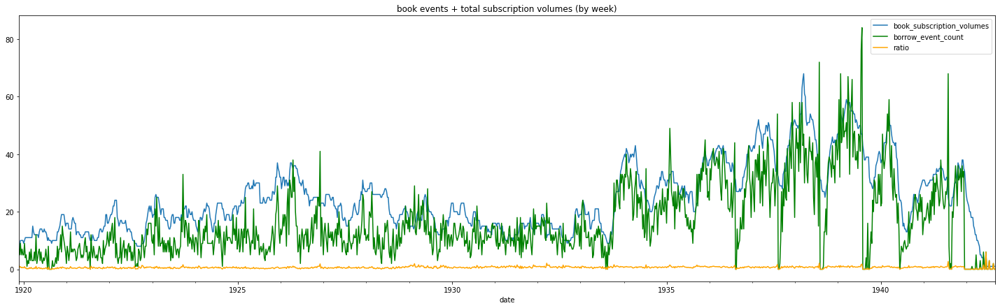

In [176]:

# get current axis so we can plot two series on the same axis
ax = plt.gca()

borrowing_weekly.plot(kind='line',x='date',y='book_subscription_volumes',ax=ax, figsize=(25,7), title='book events + total subscription volumes (by week)')
borrowing_weekly.plot(kind='line',x='date',y='borrow_event_count', color='green', ax=ax)
borrowing_weekly.plot(kind='line',x='date',y='ratio', color='orange', ax=ax)


plt.show()


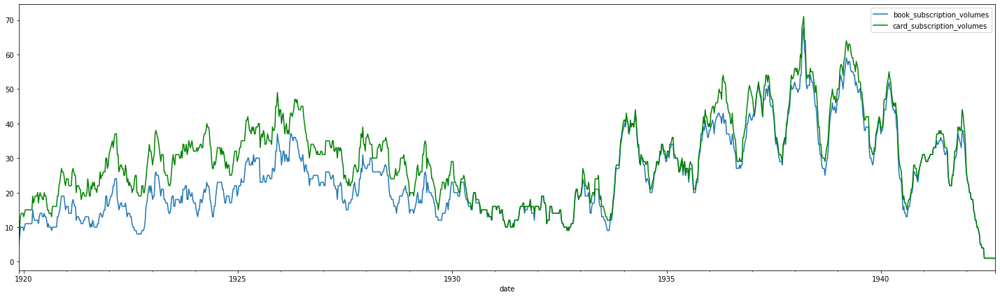

In [177]:
# how different are card volumes and book subscription volumes?

ax = plt.gca()
borrowing_weekly.plot(kind='line',x='date',y='book_subscription_volumes',ax=ax, figsize=(25,7))
borrowing_weekly.plot(kind='line',x='date',y='card_subscription_volumes', color='green', ax=ax)

plt.show()

In [178]:
# let's try aggregating by month
# borrowing_monthly = borrowing_df.groupby([pd.Grouper(key='date', freq='MS')]).agg({'book_subscription_volumes':'mean','borrow_event_count': 'sum'})
# borrowing_monthly = borrowing_monthly.reset_index()
# borrowing_monthly

# borrowing_monthly = borrowing_daily.groupby([pd.Grouper(key='date', freq='MS')]).agg({'book_subscription_volumes':'mean','borrow_event_count': 'sum'})

borrowing_monthly = borrowing_daily.groupby([pd.Grouper(key='date', freq='MS')]).agg({'book_subscription_volumes':'max','borrow_event_count': 'sum'})
borrowing_monthly = borrowing_monthly.reset_index()
borrowing_monthly


,date,book_subscription_volumes,borrow_event_count
0,1919-11-01,7.0,12
1,1919-12-01,10.0,30
2,1920-01-01,11.0,20
3,1920-02-01,11.0,14
4,1920-03-01,15.0,18
...,...,...,...
270,1942-05-01,5.0,6
271,1942-06-01,1.0,6
272,1942-07-01,1.0,3
273,1942-08-01,1.0,2


In [179]:
borrowing_monthly.borrow_event_count.describe()

count    275.000000
mean      71.360000
std       50.290302
min        0.000000
25%       38.500000
50%       53.000000
75%       99.500000
max      251.000000
Name: borrow_event_count, dtype: float64

In [180]:
borrowing_monthly['ratio'] = borrowing_monthly.apply(lambda row: row.borrow_event_count / row.book_subscription_volumes, axis=1)
borrowing_monthly.ratio.describe()

count    275.000000
mean       2.600836
std        0.985389
min        0.000000
25%        1.935417
50%        2.625000
75%        3.264231
max        6.000000
Name: ratio, dtype: float64

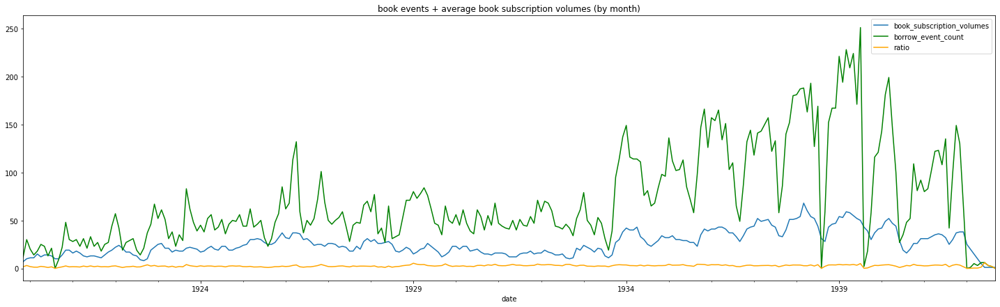

In [181]:
# get current axis so we can plot two series on the same axis
ax = plt.gca()

borrowing_monthly.plot(kind='line',x='date',y='book_subscription_volumes',ax=ax, figsize=(25,7), title='book events + average book subscription volumes (by month)')
borrowing_monthly.plot(kind='line',x='date',y='borrow_event_count', color='green', ax=ax)
borrowing_monthly.plot(kind='line',x='date',y='ratio', color='orange', ax=ax)


plt.show()

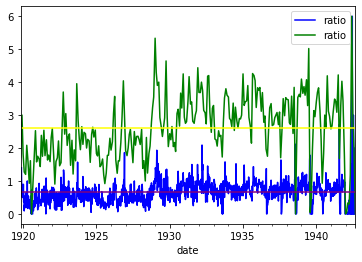

In [182]:
# if we plot just the ratio, how stable is it?
ax = plt.gca()

borrowing_weekly.plot(kind='line',x='date',y='ratio', color='blue', ax=ax)
borrowing_monthly.plot(kind='line',x='date',y='ratio', color='green', ax=ax)

# monthly ratio average
#plt.axhline(y=2.858, color='yellow', linestyle='-')  # 2.8 is ratio when we use average subscription
plt.axhline(y=2.6, color='yellow', linestyle='-')  # 2.6 is ratio when we use max # subscriptions


# weekly ratio average
plt.axhline(y=0.663, color='purple', linestyle='-')  # weekly ratio doesn't change noticeably when we switch from mean to max

plt.show()

In [183]:
# ok, now apply our ratio to the non-book subscription volumes
borrowing_weekly['non_book_subs_vols'] = borrowing_weekly.apply(lambda row: row.subscription_volumes - row.book_subscription_volumes, axis=1)
borrowing_weekly.head()

,date,book_subscription_volumes,borrow_event_count,card_subscription_volumes,subscription_volumes,ratio,non_book_subs_vols
0,1919-11-23,5.0,7,6.0,14.0,1.400000,9.0
1,1919-11-30,7.0,5,9.0,27.0,0.714286,20.0
2,1919-12-07,10.0,9,13.0,41.0,0.900000,31.0
3,1919-12-14,10.0,5,14.0,47.0,0.500000,37.0
4,1919-12-21,10.0,7,14.0,48.0,0.700000,38.0


In [184]:
borrow_events_per_subsvol = borrowing_weekly.ratio.mean()
borrow_events_per_subsvol

0.6428904216675599

In [185]:
# find an example
borrowing_weekly[borrowing_weekly.ratio >= 0.6][borrowing_weekly.ratio <= 0.65]


<ipython-input-185-2245af11e64b>:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  borrowing_weekly[borrowing_weekly.ratio >= 0.6][borrowing_weekly.ratio <= 0.65]


,date,book_subscription_volumes,borrow_event_count,card_subscription_volumes,subscription_volumes,ratio,non_book_subs_vols
15,1920-03-07,11.0,7,15.0,82.0,0.636364,71.0
47,1920-10-17,13.0,8,19.0,80.0,0.615385,67.0
54,1920-12-05,19.0,12,26.0,126.0,0.631579,107.0
73,1921-04-17,13.0,8,22.0,147.0,0.615385,134.0
83,1921-06-26,13.0,8,20.0,133.0,0.615385,120.0
...,...,...,...,...,...,...,...
1082,1940-08-18,13.0,8,15.0,34.0,0.615385,21.0
1105,1941-01-26,29.0,18,29.0,83.0,0.620690,54.0
1108,1941-02-16,30.0,19,30.0,84.0,0.633333,54.0
1121,1941-05-18,35.0,22,38.0,99.0,0.628571,64.0


In [186]:
borrowing_weekly['estimated_borrow_events'] = borrowing_weekly.non_book_subs_vols.apply(lambda x: x * borrow_events_per_subsvol)
borrowing_weekly

,date,book_subscription_volumes,borrow_event_count,card_subscription_volumes,subscription_volumes,ratio,non_book_subs_vols,estimated_borrow_events
0,1919-11-23,5.0,7,6.0,14.0,1.400000,9.0,5.786014
1,1919-11-30,7.0,5,9.0,27.0,0.714286,20.0,12.857808
2,1919-12-07,10.0,9,13.0,41.0,0.900000,31.0,19.929603
3,1919-12-14,10.0,5,14.0,47.0,0.500000,37.0,23.786946
4,1919-12-21,10.0,7,14.0,48.0,0.700000,38.0,24.429836
...,...,...,...,...,...,...,...,...
1185,1942-08-09,1.0,0,1.0,1.0,0.000000,0.0,0.000000
1186,1942-08-16,1.0,0,1.0,1.0,0.000000,0.0,0.000000
1187,1942-08-23,1.0,2,1.0,1.0,2.000000,0.0,0.000000
1188,1942-08-30,1.0,0,1.0,1.0,0.000000,0.0,0.000000


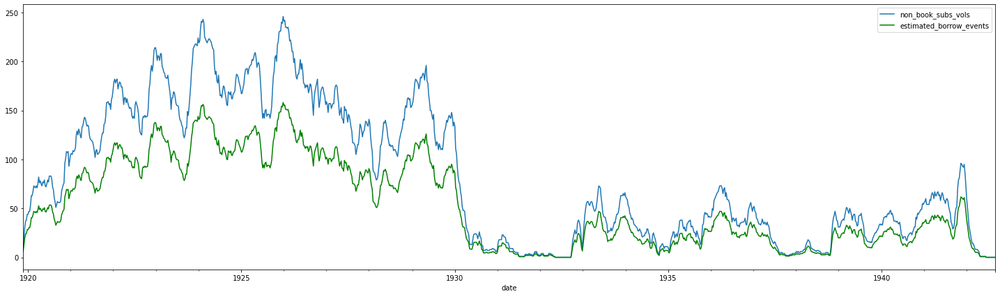

In [187]:
# plot with our estimates
ax = plt.gca()

borrowing_weekly.plot(kind='line',x='date',y='non_book_subs_vols',ax=ax, figsize=(25,7))
borrowing_weekly.plot(kind='line',x='date',y='estimated_borrow_events', color='green', ax=ax)


plt.show()

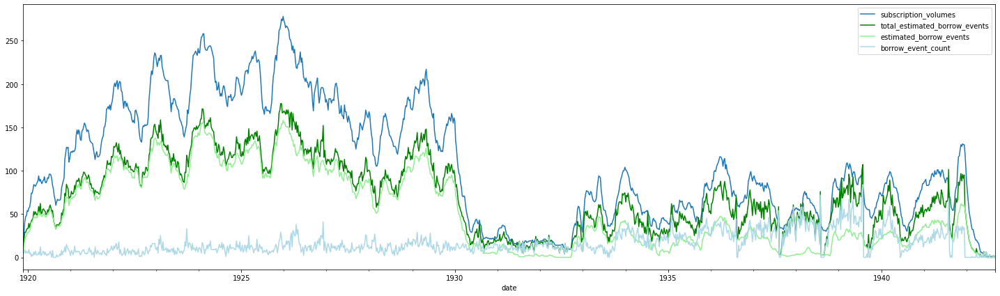

In [188]:
# now combine and plot the total

ax = plt.gca()
# tally up our estimate with the actual event count
borrowing_weekly['total_estimated_borrow_events'] = borrowing_weekly.apply(lambda row: row.estimated_borrow_events + row.borrow_event_count, axis=1)


borrowing_weekly.plot(kind='line',x='date',y='subscription_volumes',ax=ax, figsize=(25,7))
borrowing_weekly.plot(kind='line',x='date',y='total_estimated_borrow_events', color='green', ax=ax)
borrowing_weekly.plot(kind='line',x='date',y='estimated_borrow_events', color='lightgreen', ax=ax)
borrowing_weekly.plot(kind='line',x='date',y='borrow_event_count', color='lightblue', ax=ax)


plt.show()

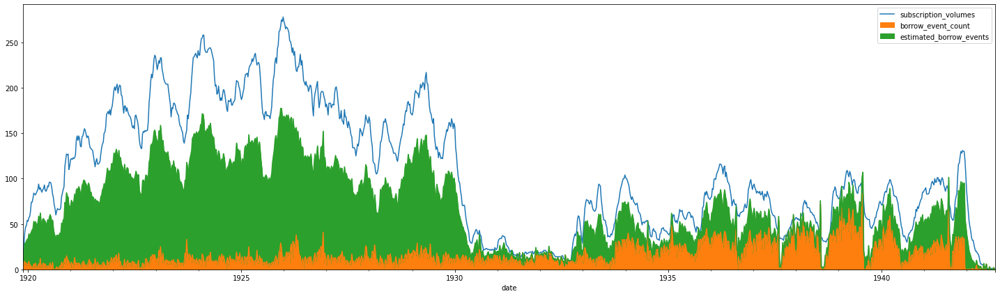

In [189]:
ax = plt.gca()
# total subscriptoin volumes
borrowing_weekly.plot(kind='line',x='date',y='subscription_volumes',ax=ax, figsize=(25,7))
# stacked area chart of actual borrows and estimated missing 
borrowing_weekly[['date', 'borrow_event_count', 'estimated_borrow_events']].plot.area(x='date', stacked=True, ax=ax)
# line plot the total over the stack (not really helpful)
# borrowing_weekly.plot(kind='line',x='date',y='total_estimated_borrow_events', color='yellow', ax=ax)




In [190]:
# how about some numbers?

# total number of estimated missing borrow events based on known subscriptions
est_total_missing_borrows = borrowing_weekly.estimated_borrow_events.sum()
est_total_missing_borrows

63330.49254804966

In [191]:
# how many borrow events did we use to generate our estimate? 
total_borrows_used_to_estimate =  borrows_within_subscriptions.shape[0]
total_borrows_used_to_estimate

17292

In [192]:
all_borrows = events_df[events_df.event_type == 'Borrow']
all_borrows

,event_type,start_date,end_date,member_uris,member_names,member_sort_names,subscription_price_paid,subscription_deposit,subscription_duration,subscription_duration_days,...,item_year,item_notes,source_type,source_citation,source_manifest,source_image,first_member_uri,second_member_uri,member_id,item_id
2,Borrow,1922,1922-08-23,https://shakespeareandco.princeton.edu/members...,Mr. Rhys,"Rhys, Mr.",NaN,NaN,NaN,NaN,...,1902.0,NaN,Lending Library Card,"Sylvia Beach, Rhys Lending Library Card, Box 4...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/67...,https://shakespeareandco.princeton.edu/members...,None,rhys,conrad-typhoon
8,Borrow,1923,1923-11-07,https://shakespeareandco.princeton.edu/members...,Eyre de Lanux / Mrs. Pierre de Lanux,"de Lanux, Eyre",NaN,NaN,NaN,NaN,...,1919.0,NaN,Lending Library Card,"Sylvia Beach, Eyre de Lanux Lending Library Ca...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/c5...,https://shakespeareandco.princeton.edu/members...,None,lanux-eyre-de,woolf-night-day
12,Borrow,1924,1924-10-22,https://shakespeareandco.princeton.edu/members...,Simone Téry,"Téry, Simone",NaN,NaN,NaN,NaN,...,NaN,Unidentified. By or about Joyce.,Lending Library Card,"Sylvia Beach, Mlle Simone Tery Lending Library...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/c2...,https://shakespeareandco.princeton.edu/members...,None,tery,james-joyce
13,Borrow,1924,1924-10-22,https://shakespeareandco.princeton.edu/members...,Simone Téry,"Téry, Simone",NaN,NaN,NaN,NaN,...,1922.0,NaN,Lending Library Card,"Sylvia Beach, Mlle Simone Tery Lending Library...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/c2...,https://shakespeareandco.princeton.edu/members...,None,tery,freeman-portrait-george-moore
22,Borrow,1926,1926-01-14,https://shakespeareandco.princeton.edu/members...,Ada (Hitchcock) MacLeish;Archibald MacLeish,"MacLeish, Ada;MacLeish, Archibald",NaN,NaN,NaN,NaN,...,1924.0,NaN,Lending Library Card,"Sylvia Beach, Ada and Archibald MacLeish Lendi...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/22...,https://shakespeareandco.princeton.edu/members...,https://shakespeareandco.princeton.edu/members...,macleish-ada,stern-tents-israel
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35457,Borrow,NaN,NaN,https://shakespeareandco.princeton.edu/members...,Bernard Hommel,"Hommel, Bernard",NaN,NaN,NaN,NaN,...,NaN,NaN,Lending Library Card,"Sylvia Beach, Bernard Hommel Lending Library C...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/e4...,https://shakespeareandco.princeton.edu/members...,None,hommel-bernard,heine-poems
35460,Borrow,NaN,NaN,https://shakespeareandco.princeton.edu/members...,Bernard Hommel,"Hommel, Bernard",NaN,NaN,NaN,NaN,...,1934.0,NaN,Lending Library Card,"Sylvia Beach, Bernard Hommel Lending Library C...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/e4...,https://shakespeareandco.princeton.edu/members...,None,hommel-bernard,cowley-exiles-return-narrative
35463,Borrow,NaN,NaN,https://shakespeareandco.princeton.edu/members...,Bernard Hommel,"Hommel, Bernard",NaN,NaN,NaN,NaN,...,1931.0,NaN,Lending Library Card,"Sylvia Beach, Bernard Hommel Lending Library C...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/e4...,https://shakespeareandco.princeton.edu/members...,None,hommel-bernard,wilson-axels-castle-study
35464,Borrow,NaN,NaN,https://shakespeareandco.princeton.edu/members...,Bernard Hommel,"Hommel, Bernard",NaN,NaN,NaN,NaN,...,NaN,Unidentified. James Thomson's *The City of Dre...,Lending Library Card,"Sylvia Beach, Bernard Hommel Lending Library C...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princet

In [193]:
all_borrows['year'] = all_borrows.start_date.apply(lambda x: x.split('-')[0] if pd.notna(x) else None)
all_borrows.year.unique()

<ipython-input-193-e360fdbd2149>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_borrows['year'] = all_borrows.start_date.apply(lambda x: x.split('-')[0] if pd.notna(x) else None)


array(['1922', '1923', '1924', '1926', '1929', '1931', '1934', '1936',
       '1937', '1938', '1940', '1942', '1944', '1946', '1948', '1952',
       '1955', '1956', '1960', '1920', '1921', '1927', '1928', '1932',
       '1935', None, '1939', '1943', '1945', '1947', '1954', '1961', '',
       '1919', '1925', '1930', '1933', '1941', '1949', '1950', '1951',
       '1953', '1957', '1958', '1962'], dtype=object)

In [194]:
official_borrows = all_borrows[all_borrows.year < "1942"]
official_borrows

,event_type,start_date,end_date,member_uris,member_names,member_sort_names,subscription_price_paid,subscription_deposit,subscription_duration,subscription_duration_days,...,item_notes,source_type,source_citation,source_manifest,source_image,first_member_uri,second_member_uri,member_id,item_id,year
2,Borrow,1922,1922-08-23,https://shakespeareandco.princeton.edu/members...,Mr. Rhys,"Rhys, Mr.",NaN,NaN,NaN,NaN,...,NaN,Lending Library Card,"Sylvia Beach, Rhys Lending Library Card, Box 4...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/67...,https://shakespeareandco.princeton.edu/members...,None,rhys,conrad-typhoon,1922
8,Borrow,1923,1923-11-07,https://shakespeareandco.princeton.edu/members...,Eyre de Lanux / Mrs. Pierre de Lanux,"de Lanux, Eyre",NaN,NaN,NaN,NaN,...,NaN,Lending Library Card,"Sylvia Beach, Eyre de Lanux Lending Library Ca...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/c5...,https://shakespeareandco.princeton.edu/members...,None,lanux-eyre-de,woolf-night-day,1923
12,Borrow,1924,1924-10-22,https://shakespeareandco.princeton.edu/members...,Simone Téry,"Téry, Simone",NaN,NaN,NaN,NaN,...,Unidentified. By or about Joyce.,Lending Library Card,"Sylvia Beach, Mlle Simone Tery Lending Library...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/c2...,https://shakespeareandco.princeton.edu/members...,None,tery,james-joyce,1924
13,Borrow,1924,1924-10-22,https://shakespeareandco.princeton.edu/members...,Simone Téry,"Téry, Simone",NaN,NaN,NaN,NaN,...,NaN,Lending Library Card,"Sylvia Beach, Mlle Simone Tery Lending Library...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/c2...,https://shakespeareandco.princeton.edu/members...,None,tery,freeman-portrait-george-moore,1924
22,Borrow,1926,1926-01-14,https://shakespeareandco.princeton.edu/members...,Ada (Hitchcock) MacLeish;Archibald MacLeish,"MacLeish, Ada;MacLeish, Archibald",NaN,NaN,NaN,NaN,...,NaN,Lending Library Card,"Sylvia Beach, Ada and Archibald MacLeish Lendi...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/22...,https://shakespeareandco.princeton.edu/members...,https://shakespeareandco.princeton.edu/members...,macleish-ada,stern-tents-israel,1926
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29452,Borrow,1941-12-12,NaN,https://shakespeareandco.princeton.edu/members...,Martine Lacorne,"Lacorne, Martine",NaN,NaN,NaN,NaN,...,NaN,Lending Library Card,"Sylvia Beach, Martine Lacorne Lending Library ...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/a5...,https://shakespeareandco.princeton.edu/members...,None,lacorne,bennett-old-wives-tale,1941
29458,Borrow,1941-12-12,1942-03-14,https://shakespeareandco.princeton.edu/members...,Madeleine Blaess,"Blaess, Madeleine",NaN,NaN,NaN,NaN,...,NaN,Lending Library Card,"Sylvia Beach, Madeleine Blaess Lending Library...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/c6...,https://shakespeareandco.princeton.edu/members...,None,blaess,de-la-roche-house,1941
29459,Borrow,1941-12-12,1942-10-06,https://shakespeareandco.princeton.edu/members...,François Valéry,"Valéry, François",NaN,NaN,NaN,NaN,...,Unidentified. Henry James's *Views and Reviews...,Lending Library Card,"Sylvia Beach, Monsieur Francois Valery Lending...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/5a...,https://shakespeareandco.princeton.edu/members...,None,valery-francois,views-reviews,1941
29460,Borrow,1941-12-12,1942-10-06,https://shakespeareandco.princeton.edu/members...,François Valéry,"Valéry, François",NaN,NaN,NaN,NaN,...,NaN,Lending Library Card,"Sylvia Beach, Monsieur Francois Valery Lending...",https://figgy.princeton.edu/concern/scanned_re...,https://

In [195]:
# how many borrows do we have total? (with/without dates)
# (todo: exclude after last subscription ?)
# members_added = members_added[members_added['date'] < datetime(1942, 1, 1)]

total_borrows = events_df[events_df.event_type == 'Borrow'].shape[0]
total_borrows 

21059

In [196]:
total_official_borrows = official_borrows.shape[0]
total_official_borrows

20597

In [197]:
total_borrows - total_official_borrows

462

In [198]:
total_official_borrows / total_borrows

0.9780616363550027

In [199]:
# what about other book activity?
book_events = events_df[events_df.item_uri.notna()]
total_book_events = book_events.shape[0]
total_book_events

22484

In [200]:
total_official_borrows / total_book_events

0.9160736523750223

In [201]:
total_official_borrows - total_borrows_used_to_estimate  

3305

In [202]:
# estimated total based on subscriptions
est_total = est_total_missing_borrows + total_borrows_used_to_estimate
est_total

80622.49254804966

In [203]:
total_official_borrows / est_total


0.2554746119728875

In [ ]:
# how hard to report by decade? 